## Forecasting Marine Ecosystem Shifts: CALCOFI Data Insights 
## for Long-Term Coastal Stewardship 

# Omkar Hanumant Thorve : 24070149016
# Nishit Bohra M : 24070149015
# Avantika Ramprasad Patil : 24070149019

The title focuses on the main aspects of CalCOFI data-oceanographic and marine biology data, thus capturing the spirit of the project well. This dataset has been compiled in the process of collaborative research since 1949 and contains within its rich information about the ecosystem of the California Current which extends from the West Coast of the United States of America to Mexico. The main aim of this study is to analyse and understand the different physical, chemical and biological components of the ocean with respect to this ecosystem.

# Step 1: Importing Required Libraries

In [1]:
# Importing necessary libraries for data analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from datetime import datetime
import missingno as msno
import warnings
warnings.filterwarnings("ignore")

# Step 2: Loading the Datasets

In [2]:
# Loading the datasets
bottle_data = pd.read_csv(r"C:\Users\Kanchan\Desktop\CALCOFI Dataset\194903-202105_Bottle.csv",encoding='unicode_escape') 
cast_data = pd.read_csv(r"C:\Users\Kanchan\Desktop\CALCOFI Dataset\194903-202105_Cast.csv",encoding='unicode_escape')  

# Displaying the first few rows of each dataset to verify the data
bottle_data.head()

,Cst_Cnt,Btl_Cnt,Sta_ID,Depth_ID,Depthm,T_degC,Salnty,O2ml_L,STheta,O2Sat,...,R_DYNHT,R_Nuts,R_Oxy_µmol/Kg,DIC1,DIC2,TA1,TA2,pH1,pH2,DIC Quality Comment
0,1,1,054.0 056.0,19-4903CR-HY-060-0930-05400560-0000A-3,0,10.50,33.440,NaN,25.649,NaN,...,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2,054.0 056.0,19-4903CR-HY-060-0930-05400560-0008A-3,8,10.46,33.440,NaN,25.656,NaN,...,0.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,3,054.0 056.0,19-4903CR-HY-060-0930-05400560-0010A-7,10,10.46,33.437,NaN,25.654,NaN,...,0.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,4,054.0 056.0,19-4903CR-HY-060-0930-05400560-0019A-3,19,10.45,33.420,NaN,25.643,NaN,...,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,5,054.0 056.0,19-4903CR-HY-060-0930-05400560-0020A-7,20,10.45,33.421,NaN,25.643,NaN,...,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
bottle_data.shape

(895371, 62)

In [4]:
cast_data.shape

(35644, 61)

In [3]:
cast_data.head()

,Cst_Cnt,Cruise_ID,Cruise,Cruz_Sta,DbSta_ID,Cast_ID,Sta_ID,Quarter,Sta_Code,Distance,...,Wave_Prd,Wind_Dir,Wind_Spd,Barometer,Dry_T,Wet_T,Wea,Cloud_Typ,Cloud_Amt,Visibility
0,1,1949-03-01-C-31CR,194903,19490305400560,5400560,19-4903CR-HY-060-0930-05400560,054.0 056.0,1,NST,NaN,...,NaN,23.0,18.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN
1,2,1949-03-01-C-31CR,194903,19490305200750,5200750,19-4903CR-HY-060-2112-05200750,052.0 075.0,1,NST,NaN,...,NaN,16.0,5.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN
2,3,1949-03-01-C-31CR,194903,19490305100850,5100850,19-4903CR-HY-061-0354-05100850,051.0 085.0,1,NST,NaN,...,NaN,23.0,5.0,NaN,NaN,NaN,6.0,NaN,NaN,NaN
3,4,1949-03-01-C-31CR,194903,19490305000950,5000950,19-4903CR-HY-061-1042-05000950,050.0 095.0,1,NST,NaN,...,NaN,18.0,8.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN
4,5,1949-03-01-C-31CR,194903,19490305001040,5001040,19-4903CR-HY-061-1706-05001040,050.0 104.0,1,NST,NaN,...,NaN,27.0,13.0,NaN,NaN,NaN,7.0,NaN,NaN,NaN


# Step 3: Basic Data Exploration
In this step, we:

Use **.info()** to get an overview of each dataset, which shows the column names, non-null counts, and data types.
Use **.describe()** to generate summary statistics for all columns, helping us understand the distribution, central tendency, and spread of the numerical columns. By specifying **include='all'**, we also get insights into categorical columns.
Check for missing values using **.isnull().sum()** to identify columns that might need cleaning or imputation later.

In [4]:
# Checking the structure and summary of the bottle dataset
print("Bottle Dataset Info:")
bottle_data.info() 

Bottle Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 895371 entries, 0 to 895370
Data columns (total 62 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Cst_Cnt              895371 non-null  int64  
 1   Btl_Cnt              895371 non-null  int64  
 2   Sta_ID               895371 non-null  object 
 3   Depth_ID             895371 non-null  object 
 4   Depthm               895371 non-null  int64  
 5   T_degC               884402 non-null  float64
 6   Salnty               848015 non-null  float64
 7   O2ml_L               725630 non-null  float64
 8   STheta               842675 non-null  float64
 9   O2Sat                690746 non-null  float64
 10  Oxy_µmol/Kg          690698 non-null  float64
 11  BtlNum               138967 non-null  float64
 12  RecInd               895371 non-null  int64  
 13  T_prec               884408 non-null  float64
 14  T_qual               24016 non-null   float64
 

In [5]:
print("\nBottle Dataset Description:")
bottle_data.describe(include='all') 


Bottle Dataset Description:


,Cst_Cnt,Btl_Cnt,Sta_ID,Depth_ID,Depthm,T_degC,Salnty,O2ml_L,STheta,O2Sat,...,R_DYNHT,R_Nuts,R_Oxy_µmol/Kg,DIC1,DIC2,TA1,TA2,pH1,pH2,DIC Quality Comment
count,895371.000000,895371.000000,895371,895371,895371.000000,884402.000000,848015.000000,725630.000000,842675.000000,690746.000000,...,848683.000000,90509.000000,690698.000000,1999.000000,224.000000,2084.000000,234.000000,84.000000,10.000000,55
unique,NaN,NaN,2634,895349,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37
top,NaN,NaN,090.0 070.0,20-1911OC-MX-313-1236-09000530-0002A-3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CTD Bottle Misfire; DIC sample compromised. C...
freq,NaN,NaN,10560,2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
mean,17747.708684,447686.027682,NaN,NaN,224.366744,10.819050,33.828139,3.399955,25.813919,57.225728,...,0.428919,0.078659,149.114587,2153.239714,2168.148330,2256.055845,2278.858803,7.910983,7.948570,NaN
std,10574.444952,258471.536174,NaN,NaN,312.163785,4.230675,0.529472,2.084452,1.160761,37.321875,...,0.379582,0.316057,90.712253,112.995202,154.852332,34.844435,58.496495,0.077666,0.021216,NaN
min,1.000000,1.000000,NaN,NaN,0.000000,1.440000,9.500900,-200.222000,16.996010,-3605.220000,...,0.000000,0.000000,-8740.570000,1948.850000,1969.440000,2181.570000,2198.150000,7.618300,7.923100,NaN
25%,8551.000000,223843.500000,NaN,NaN,45.000000,7.710000,33.485000,1.370000,24.961000,21.300000,...,0.130000,0.000000,61.767690,2028.330000,2008.977500,2230.322500,2229.062500,7.898675,7.931475,NaN
50%,17665.000000,447686.000000,NaN,NaN,125.000000,10.070000,33.857300,3.450000,25.989000,54.500000,...,0.340000,0.000000,151.492450,2170.640000,2265.885000,2244.325000,2247.505000,7.928850,7.946650,NaN
75%,27426.000000,671528.500000,NaN,NaN,300.000000,13.900000,34.190000,5.500000,26.642000,97.700000,...,0.630000,0.060000,240.576900,2253.810000,2315.525000,2278.505000,2316.452500,7.955100,7.963300,NaN


In [6]:
# Checking the structure and summary of the cast dataset
print("\nCast Dataset Info:")
cast_data.info()


Cast Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35644 entries, 0 to 35643
Data columns (total 61 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Cst_Cnt      35644 non-null  int64  
 1   Cruise_ID    35644 non-null  object 
 2   Cruise       35644 non-null  int64  
 3   Cruz_Sta     35644 non-null  int64  
 4   DbSta_ID     35644 non-null  int64  
 5   Cast_ID      35644 non-null  object 
 6   Sta_ID       35644 non-null  object 
 7   Quarter      35644 non-null  int64  
 8   Sta_Code     35644 non-null  object 
 9   Distance     20954 non-null  float64
 10  Date         35644 non-null  object 
 11  Year         35644 non-null  int64  
 12  Month        35644 non-null  int64  
 13  Julian_Date  35644 non-null  int64  
 14  Julian_Day   35644 non-null  int64  
 15  Time         35320 non-null  object 
 16  Lat_Dec      35644 non-null  float64
 17  Lat_Deg      35644 non-null  int64  
 18  Lat_Min      35644 non-nul

In [7]:
print("\nCast Dataset Description:")
cast_data.describe(include='all')



Cast Dataset Description:


,Cst_Cnt,Cruise_ID,Cruise,Cruz_Sta,DbSta_ID,Cast_ID,Sta_ID,Quarter,Sta_Code,Distance,...,Wave_Prd,Wind_Dir,Wind_Spd,Barometer,Dry_T,Wet_T,Wea,Cloud_Typ,Cloud_Amt,Visibility
count,35644.000000,35644,35644.000000,3.564400e+04,3.564400e+04,35644,35644,35644.000000,35644,20954.000000,...,12267.000000,34167.000000,33965.000000,20302.000000,20309.000000,20227.000000,27450.000000,10456.000000,12520.000000,10149.000000
unique,NaN,662,NaN,NaN,NaN,35644,2634,NaN,7,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,1988-08-29-C-32NM,NaN,NaN,NaN,19-4903CR-HY-060-0930-05400560,090.0 045.0,NaN,ST,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,433,NaN,NaN,NaN,1,363,NaN,16357,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,17822.500000,NaN,197561.253816,1.975613e+13,9.301021e+06,NaN,NaN,2.366569,NaN,-115.392800,...,6.475259,27.031112,11.128721,1016.226052,16.269349,14.424517,1.324517,5.665742,4.977875,6.804217
std,10289.680834,NaN,2105.321976,2.105317e+11,2.188920e+06,NaN,NaN,1.093174,NaN,116.413368,...,2.293684,9.454556,6.818359,8.606433,2.717945,2.640487,1.157576,2.151524,3.107583,1.515261
min,1.000000,NaN,194903.000000,1.949030e+13,1.016800e+05,NaN,NaN,1.000000,NaN,-1920.150000,...,0.000000,0.000000,0.000000,101.400000,1.700000,1.800000,0.000000,0.000000,0.000000,0.000000
25%,8911.750000,NaN,195706.000000,1.957061e+13,8.001470e+06,NaN,NaN,1.000000,NaN,-169.800000,...,5.000000,26.000000,6.000000,1013.700000,14.400000,12.600000,1.000000,6.000000,2.000000,6.000000
50%,17822.500000,NaN,197202.000000,1.972021e+13,9.000700e+06,NaN,NaN,2.000000,NaN,-83.370000,...,6.000000,31.000000,10.000000,1016.200000,16.100000,14.300000,1.000000,6.000000,6.000000,7.000000
75%,26733.250000,NaN,199101.000000,1.991011e+13,1.033080e+07,NaN,NaN,3.000000,NaN,-29.227750,...,8.000000,33.000000,15.000000,1019.000000,18.000000,16.000000,2.000000,7.000000,8.000000,8.000000


In [8]:
# Checking for missing values in the bottle dataset
print("\nMissing Values in Bottle Dataset:")
bottle_data.isnull().sum()



Missing Values in Bottle Dataset:


Cst_Cnt                     0
Btl_Cnt                     0
Sta_ID                      0
Depth_ID                    0
Depthm                      0
                        ...  
TA1                    893287
TA2                    895137
pH1                    895287
pH2                    895361
DIC Quality Comment    895316
Length: 62, dtype: int64

In [9]:
# Checking for missing values in the cast dataset
print("\nMissing Values in Cast Dataset:")
cast_data.isnull().sum()


Missing Values in Cast Dataset:


Cst_Cnt           0
Cruise_ID         0
Cruise            0
Cruz_Sta          0
DbSta_ID          0
              ...  
Wet_T         15417
Wea            8194
Cloud_Typ     25188
Cloud_Amt     23124
Visibility    25495
Length: 61, dtype: int64

# Step 4: Visualizing Missing Data Patterns
We use **missingno.heatmap** to visualize missing data patterns. The heatmap shows the concentration and distribution of missing values across each column, helping us decide which columns to drop or impute based on missing data patterns.



Missing Data Heatmap for Bottle Dataset:


<Axes: >

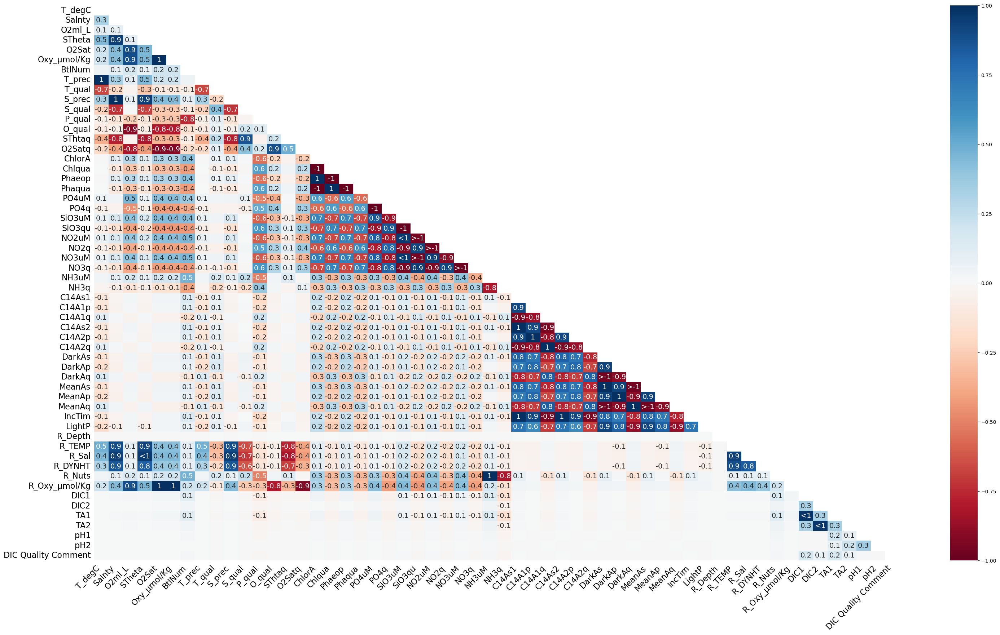

In [10]:
# Visualize missing values in the bottle dataset
print("Missing Data Heatmap for Bottle Dataset:")
msno.heatmap(bottle_data, figsize=(36, 20))

Missing Data Heatmap for Cast Dataset:


<Axes: >

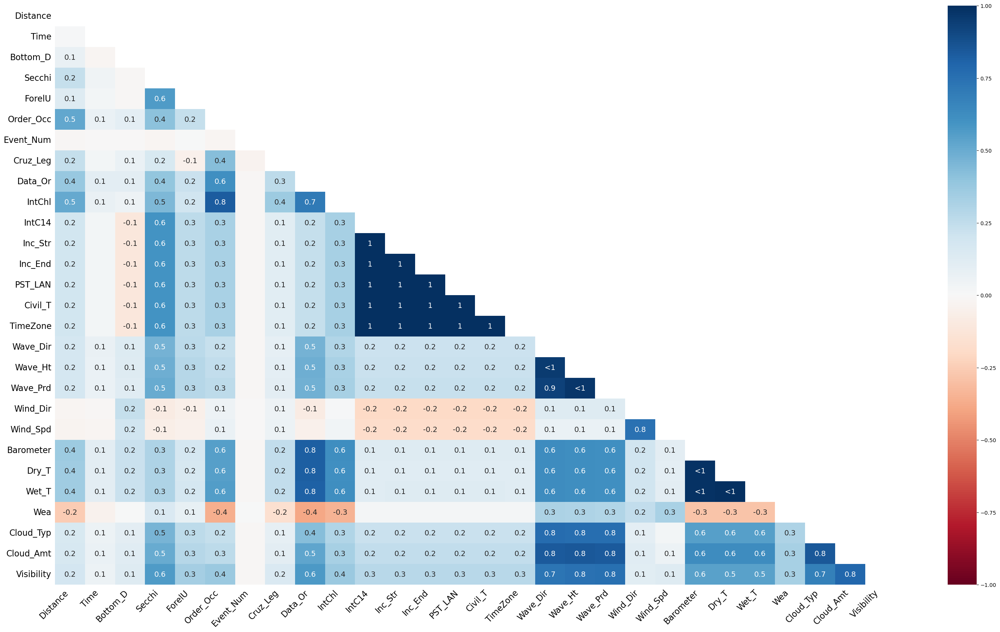

In [11]:
# Visualize missing values in the cast dataset
print("Missing Data Heatmap for Cast Dataset:")
msno.heatmap(cast_data, figsize=(36, 20))

### Step 1: Dropping Columns with High Missingness
In this step, we drop columns that have over 90% missing values. These columns add little value to the analysis and can lead to biased or skewed results if imputed. This step reduces the complexity of the dataset, focusing only on the most informative columns.


In [12]:
# Define threshold for missing values (90%)
threshold = 0.9

# Drop columns in the bottle dataset with >90% missing values
bottle_data = bottle_data.loc[:, bottle_data.isnull().mean() < threshold]
print("Remaining columns in Bottle dataset after dropping columns with >90% missing values:")
print(bottle_data.columns)

Remaining columns in Bottle dataset after dropping columns with >90% missing values:
Index(['Cst_Cnt', 'Btl_Cnt', 'Sta_ID', 'Depth_ID', 'Depthm', 'T_degC',
       'Salnty', 'O2ml_L', 'STheta', 'O2Sat', 'Oxy_µmol/Kg', 'BtlNum',
       'RecInd', 'T_prec', 'S_prec', 'P_qual', 'O_qual', 'O2Satq', 'ChlorA',
       'Chlqua', 'Phaeop', 'Phaqua', 'PO4uM', 'PO4q', 'SiO3uM', 'SiO3qu',
       'NO2uM', 'NO2q', 'NO3uM', 'NO3q', 'NH3uM', 'NH3q', 'C14A1q', 'C14A2q',
       'DarkAq', 'MeanAq', 'R_Depth', 'R_TEMP', 'R_Sal', 'R_DYNHT', 'R_Nuts',
       'R_Oxy_µmol/Kg'],
      dtype='object')


In [13]:
# Drop columns in the cast dataset with >90% missing values
cast_data = cast_data.loc[:, cast_data.isnull().mean() < threshold]
print("\nRemaining columns in Cast dataset after dropping columns with >90% missing values:")
print(cast_data.columns)


Remaining columns in Cast dataset after dropping columns with >90% missing values:
Index(['Cst_Cnt', 'Cruise_ID', 'Cruise', 'Cruz_Sta', 'DbSta_ID', 'Cast_ID',
       'Sta_ID', 'Quarter', 'Sta_Code', 'Distance', 'Date', 'Year', 'Month',
       'Julian_Date', 'Julian_Day', 'Time', 'Lat_Dec', 'Lat_Deg', 'Lat_Min',
       'Lat_Hem', 'Lon_Dec', 'Lon_Deg', 'Lon_Min', 'Lon_Hem', 'Rpt_Line',
       'St_Line', 'Ac_Line', 'Rpt_Sta', 'St_Station', 'Ac_Sta', 'Bottom_D',
       'Secchi', 'Ship_Name', 'Ship_Code', 'Data_Type', 'Order_Occ',
       'Event_Num', 'Orig_Sta_ID', 'Data_Or', 'Cruz_Num', 'IntChl', 'Wave_Dir',
       'Wave_Ht', 'Wave_Prd', 'Wind_Dir', 'Wind_Spd', 'Barometer', 'Dry_T',
       'Wet_T', 'Wea', 'Cloud_Typ', 'Cloud_Amt', 'Visibility'],
      dtype='object')


### Step 2: Imputing Missing Values
In this step, we impute missing values for the remaining columns in the dataset:
- **Numerical columns**: We use the median value to impute missing data.
- **Categorical columns**: We impute missing data using the mode (most frequent value).

Imputation helps to preserve data points, preventing the loss of information during the analysis while maintaining dataset integrity.


In [14]:
from sklearn.impute import SimpleImputer

# Impute numerical columns with the median value
numerical_cols_bottle = bottle_data.select_dtypes(include=['float64', 'int64']).columns
numerical_cols_cast = cast_data.select_dtypes(include=['float64', 'int64']).columns

# Create an imputer for numerical columns (using median)
numerical_imputer = SimpleImputer(strategy='median')

# Apply the imputer to the numerical columns
bottle_data[numerical_cols_bottle] = numerical_imputer.fit_transform(bottle_data[numerical_cols_bottle])
cast_data[numerical_cols_cast] = numerical_imputer.fit_transform(cast_data[numerical_cols_cast])

# Impute categorical columns with the mode (most frequent value)
categorical_cols_bottle = bottle_data.select_dtypes(include=['object']).columns
categorical_cols_cast = cast_data.select_dtypes(include=['object']).columns


In [15]:
# Create an imputer for categorical columns (using mode)
categorical_imputer = SimpleImputer(strategy='most_frequent')

# Apply the imputer to the categorical columns
bottle_data[categorical_cols_bottle] = categorical_imputer.fit_transform(bottle_data[categorical_cols_bottle])
cast_data[categorical_cols_cast] = categorical_imputer.fit_transform(cast_data[categorical_cols_cast])

print("Imputation completed for both datasets.")

Imputation completed for both datasets.


### Step 3: Outlier Removal Using the IQR Method
To handle outliers, we use the Interquartile Range (IQR) method, which is effective for skewed distributions. For each numerical column, we calculate the first (Q1) and third (Q3) quartiles, and the IQR as the difference between Q3 and Q1. Rows with values outside the range \[Q1 - 1.5 * IQR, Q3 + 1.5 * IQR\] are removed as outliers. This method is more robust for datasets with skewed distributions compared to the Z-score method.


In [16]:
# Function to remove outliers using the IQR method
def remove_outliers_iqr(data, numerical_cols):
    for col in numerical_cols:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        # Define outlier bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # Filter data to keep only rows within the bounds
        data = data[(data[col] >= lower_bound) & (data[col] <= upper_bound)]
    
    return data

# Apply the IQR-based outlier removal function to both datasets
bottle_data = remove_outliers_iqr(bottle_data, numerical_cols_bottle)
cast_data = remove_outliers_iqr(cast_data, numerical_cols_cast)

# Check remaining rows in both datasets
print("Number of rows in Bottle dataset after IQR outlier removal:", len(bottle_data))
print("Number of rows in Cast dataset after IQR outlier removal:", len(cast_data))

# Save the cleaned data back to the original CSV files
bottle_data.to_csv('Bottle_cleaned.csv', index=False)
cast_data.to_csv('Cast_cleaned.csv', index=False)


Number of rows in Bottle dataset after IQR outlier removal: 361447
Number of rows in Cast dataset after IQR outlier removal: 9059


### Step 4: Exploratory Data Analysis (EDA)

Exploratory Data Analysis (EDA) allows us to better understand the dataset, its structure, and the relationships between variables. In this step, we perform the following:

1. **Summary Statistics**: We calculate basic statistics for numerical columns such as mean, standard deviation, minimum, and maximum values to understand the range and central tendency.
2. **Distribution Visualization**: We plot histograms and boxplots for numerical features to visually inspect the distribution and identify any potential skewness or outliers.
3. **Correlation Matrix**: We generate a correlation matrix to examine the relationships between numerical variables. This helps identify variables that are strongly correlated or show patterns.
4. **Missing Value Check**: We verify that there are no remaining missing values in the dataset after imputation and outlier removal.

These steps will help us identify key trends, anomalies, and relationships in the data, providing insights for the dashboard creation.


In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Summary statistics for numerical columns
print("Numerical summary statistics for Bottle dataset:")
print(bottle_data.describe())

print("\nNumerical summary statistics for Cast dataset:")
print(cast_data.describe())

Numerical summary statistics for Bottle dataset:
             Cst_Cnt        Btl_Cnt         Depthm         T_degC  \
count  361447.000000  361447.000000  361447.000000  361447.000000   
mean    10867.679707  282559.377682     165.055275      11.146243   
std      5617.847405  139260.498579     148.901181       3.691908   
min         1.000000       2.000000       0.000000       2.230000   
25%      6568.000000  169549.500000      49.000000       8.330000   
50%     10675.000000  278365.000000     125.000000      10.260000   
75%     14733.000000  392522.500000     250.000000      13.760000   
max     35502.000000  892466.000000     577.000000      22.920000   

              Salnty         O2ml_L         STheta          O2Sat  \
count  361447.000000  361447.000000  361447.000000  361447.000000   
mean       33.858585       3.358750      25.803298      54.892952   
std         0.411728       1.624737       0.866155      28.243942   
min        32.514000       0.000000      23.118000   

In [18]:
# Check data types to ensure we're working with numeric columns for plotting and correlation
print("Data types in Bottle dataset:")
print(bottle_data.dtypes)

print("\nData types in Cast dataset:")
print(cast_data.dtypes)


Data types in Bottle dataset:
Cst_Cnt          float64
Btl_Cnt          float64
Sta_ID            object
Depth_ID          object
Depthm           float64
T_degC           float64
Salnty           float64
O2ml_L           float64
STheta           float64
O2Sat            float64
Oxy_µmol/Kg      float64
BtlNum           float64
RecInd           float64
T_prec           float64
S_prec           float64
P_qual           float64
O_qual           float64
O2Satq           float64
ChlorA           float64
Chlqua           float64
Phaeop           float64
Phaqua           float64
PO4uM            float64
PO4q             float64
SiO3uM           float64
SiO3qu           float64
NO2uM            float64
NO2q             float64
NO3uM            float64
NO3q             float64
NH3uM            float64
NH3q             float64
C14A1q           float64
C14A2q           float64
DarkAq           float64
MeanAq           float64
R_Depth          float64
R_TEMP           float64
R_Sal            flo

In [19]:
# Check the number of rows in the datasets after outlier removal
print("Number of rows in Bottle dataset after outlier removal:", len(bottle_data))
print("Number of rows in Cast dataset after outlier removal:", len(cast_data))


Number of rows in Bottle dataset after outlier removal: 361447
Number of rows in Cast dataset after outlier removal: 9059


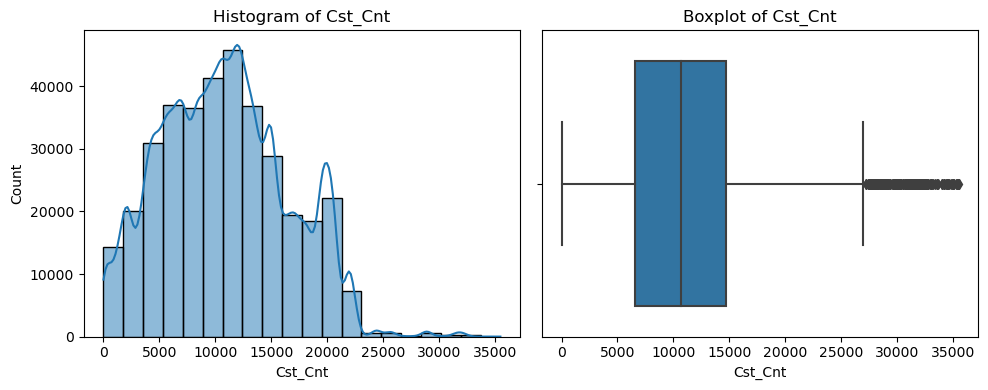

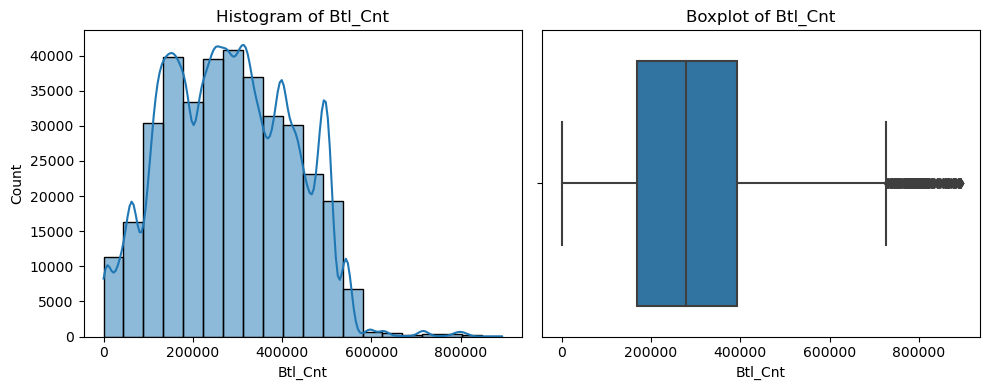

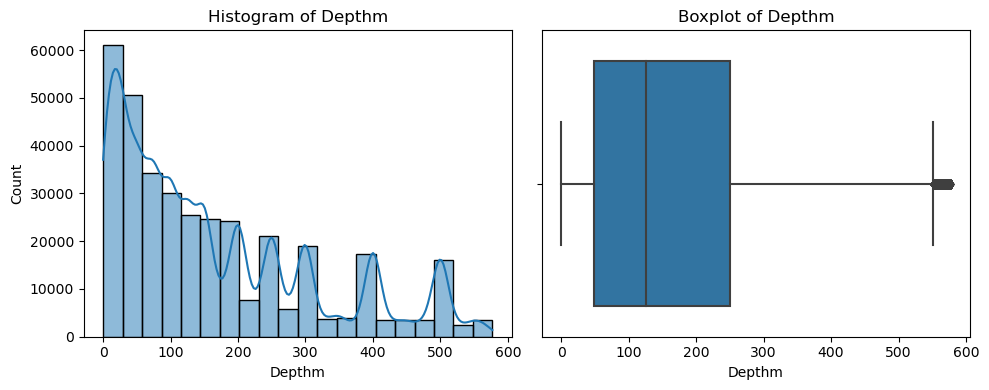

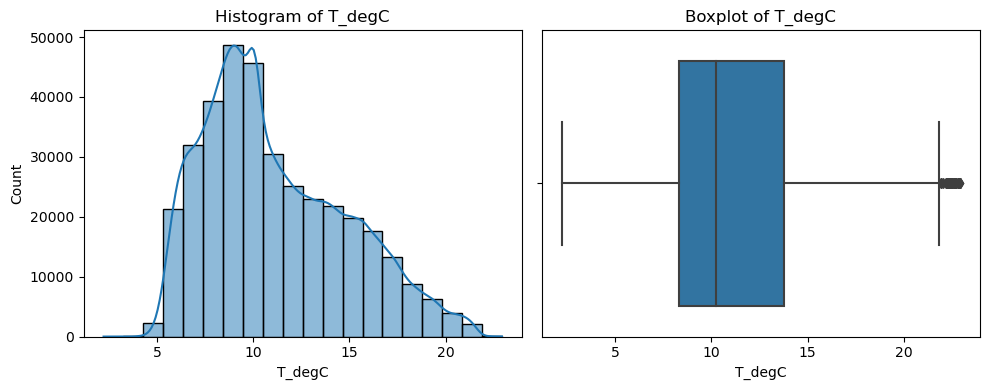

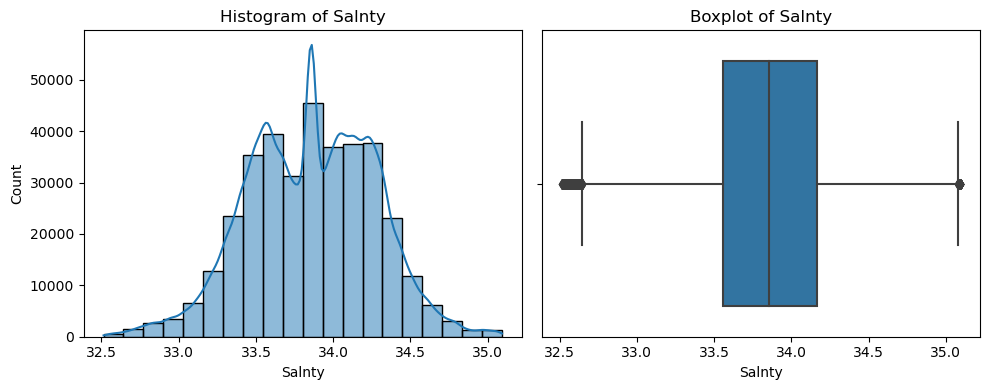

...

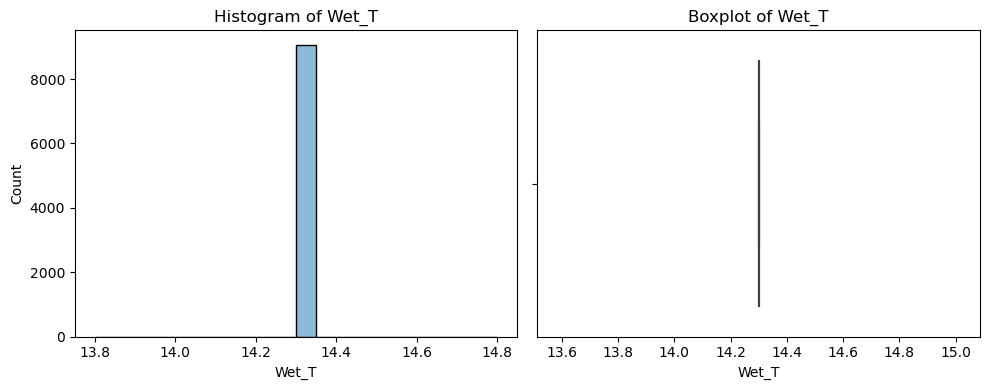

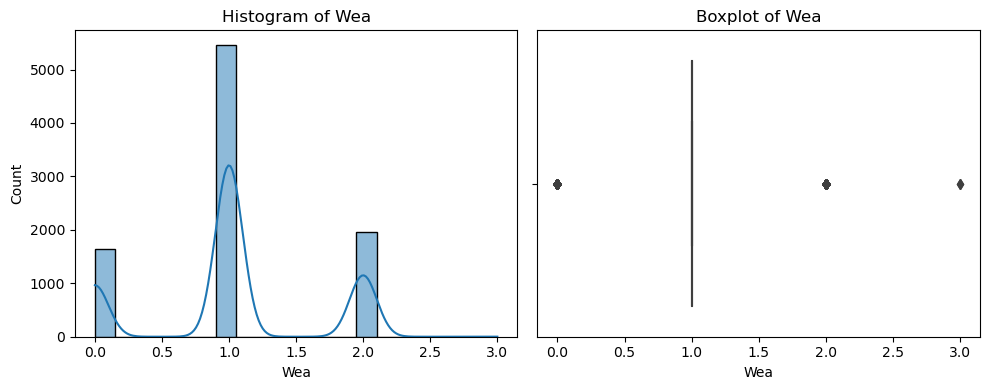

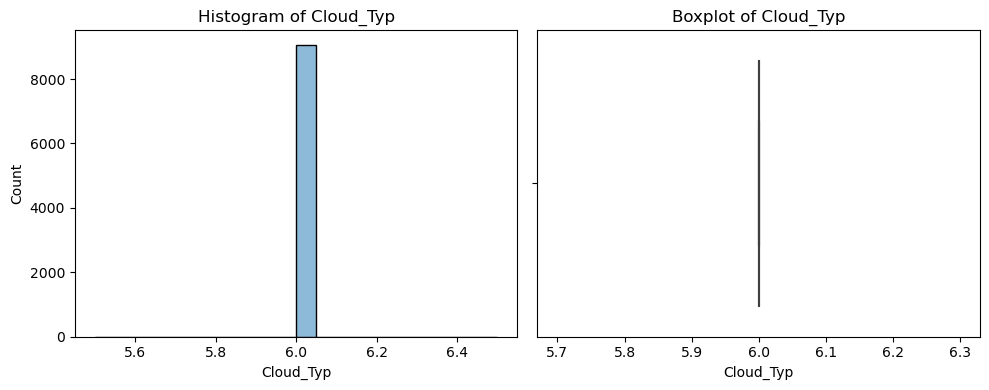

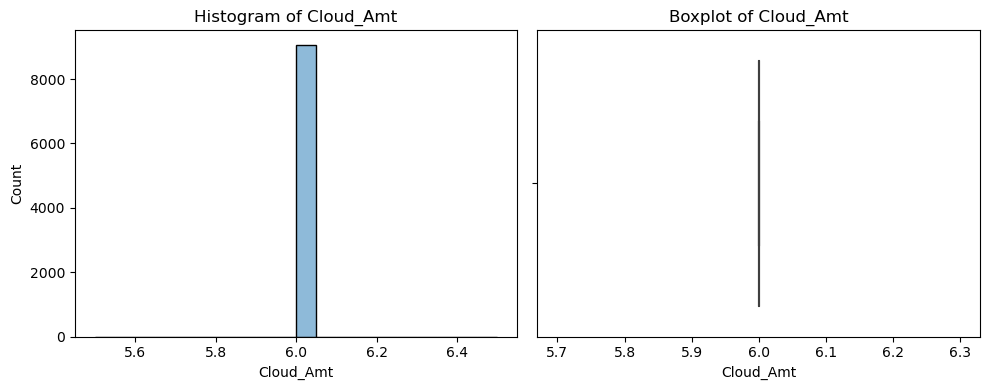

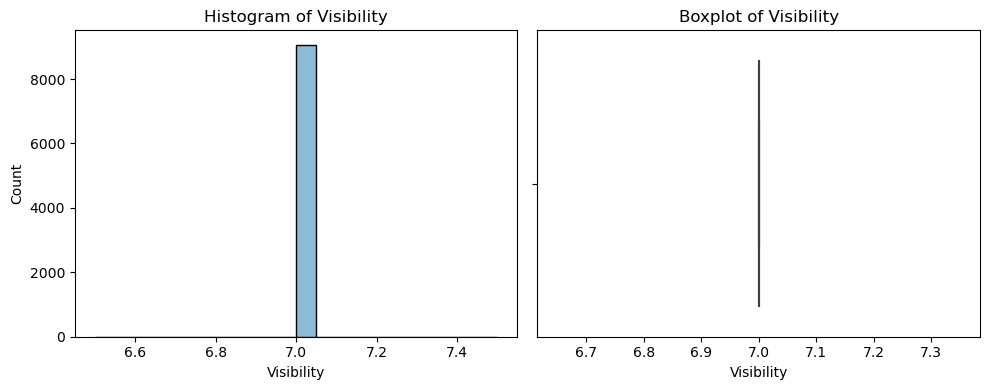

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribution plots for numerical features (histograms and boxplots)
def plot_distribution(data, numerical_cols):
    for col in numerical_cols:
        plt.figure(figsize=(10, 4))

        # Histogram
        plt.subplot(1, 2, 1)
        sns.histplot(data[col], kde=True, bins=20)
        plt.title(f"Histogram of {col}")

        # Boxplot
        plt.subplot(1, 2, 2)
        sns.boxplot(x=data[col])  # Corrected line
        plt.title(f"Boxplot of {col}")
        
        plt.tight_layout()  # Adjust the spacing between plots
        plt.show()

# Plot distributions for numerical columns in both datasets
plot_distribution(bottle_data, numerical_cols_bottle)
plot_distribution(cast_data, numerical_cols_cast)



Numerical columns in Bottle dataset: Index(['Cst_Cnt', 'Btl_Cnt', 'Depthm', 'T_degC', 'Salnty', 'O2ml_L', 'STheta',
       'O2Sat', 'Oxy_µmol/Kg', 'BtlNum', 'RecInd', 'T_prec', 'S_prec',
       'P_qual', 'O_qual', 'O2Satq', 'ChlorA', 'Chlqua', 'Phaeop', 'Phaqua',
       'PO4uM', 'PO4q', 'SiO3uM', 'SiO3qu', 'NO2uM', 'NO2q', 'NO3uM', 'NO3q',
       'NH3uM', 'NH3q', 'C14A1q', 'C14A2q', 'DarkAq', 'MeanAq', 'R_Depth',
       'R_TEMP', 'R_Sal', 'R_DYNHT', 'R_Nuts', 'R_Oxy_µmol/Kg'],
      dtype='object')
Numerical columns in Cast dataset: Index(['Cst_Cnt', 'Cruise', 'Cruz_Sta', 'DbSta_ID', 'Quarter', 'Distance',
       'Year', 'Month', 'Julian_Date', 'Julian_Day', 'Lat_Dec', 'Lat_Deg',
       'Lat_Min', 'Lon_Dec', 'Lon_Deg', 'Lon_Min', 'Rpt_Line', 'St_Line',
       'Ac_Line', 'Rpt_Sta', 'St_Station', 'Ac_Sta', 'Bottom_D', 'Secchi',
       'Order_Occ', 'Event_Num', 'IntChl', 'Wave_Dir', 'Wave_Ht', 'Wave_Prd',
       'Wind_Dir', 'Wind_Spd', 'Barometer', 'Dry_T', 'Wet_T', 'Wea',
       'Cloud_

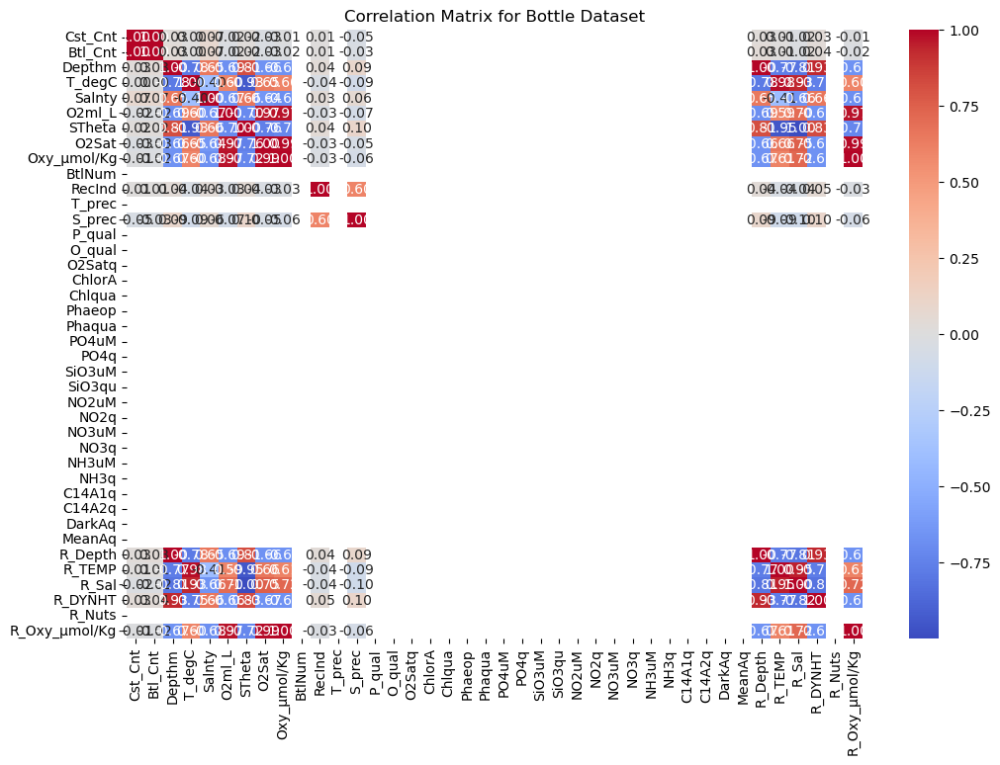

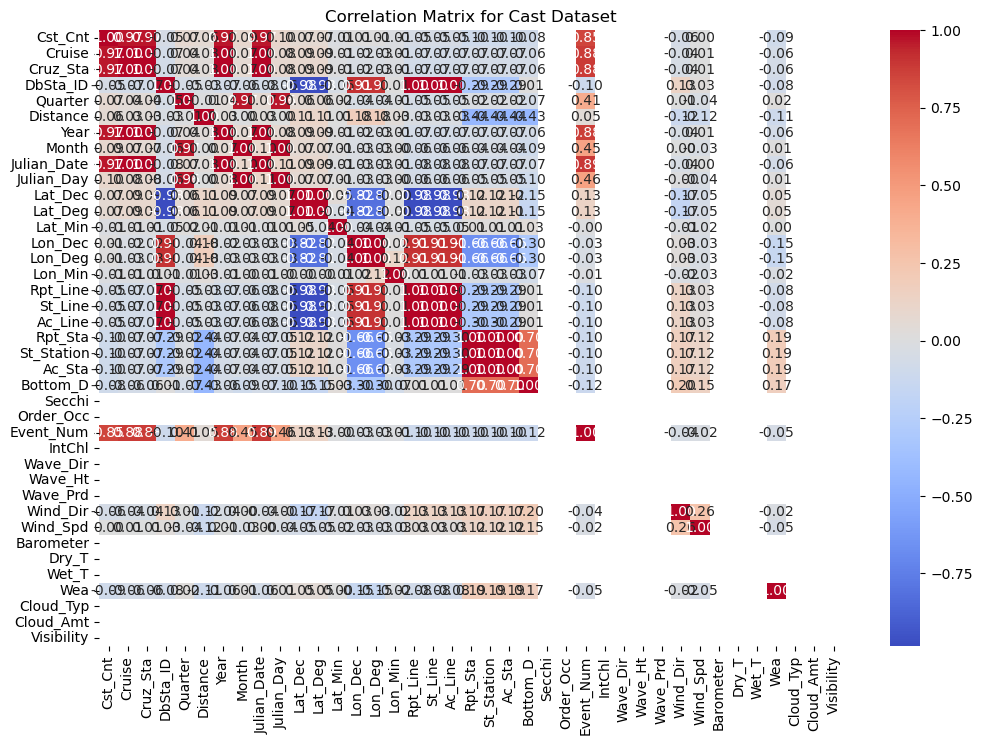

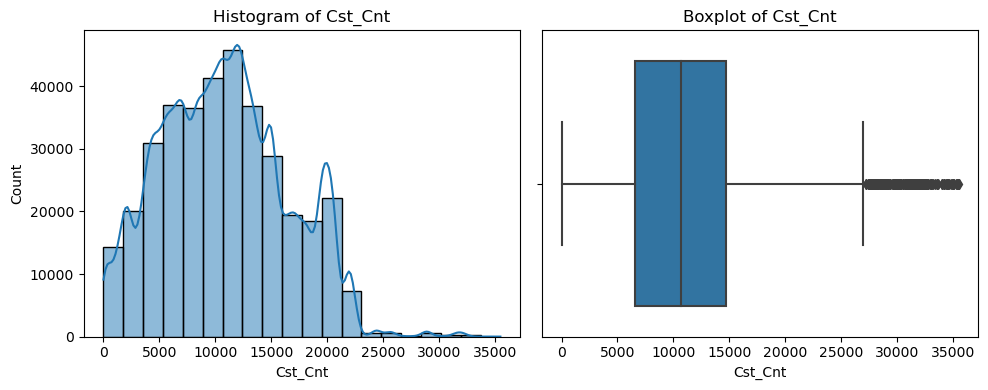

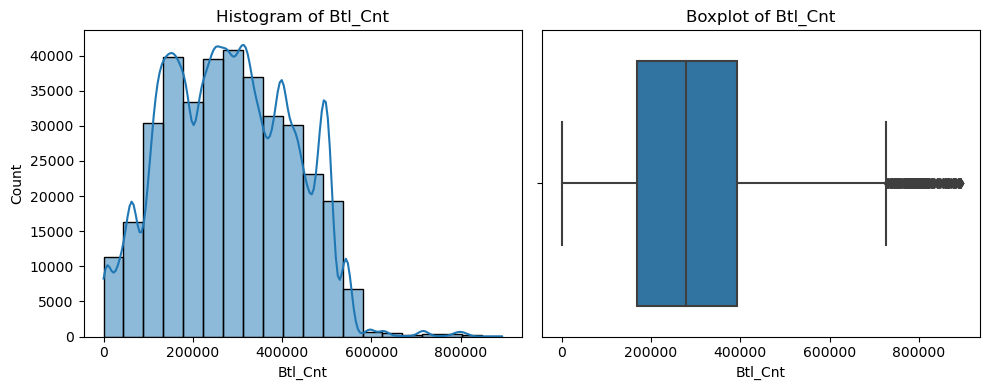

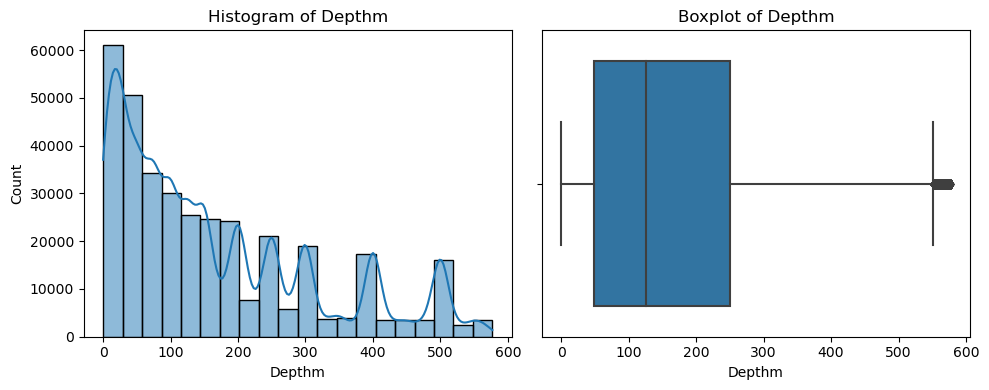

...

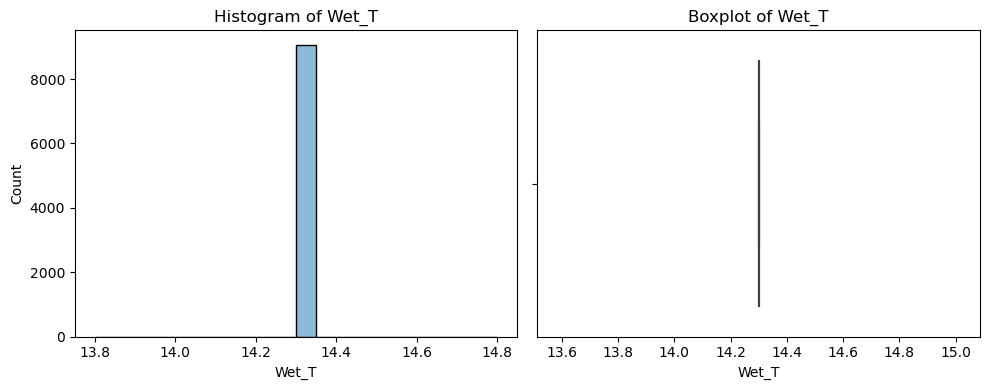

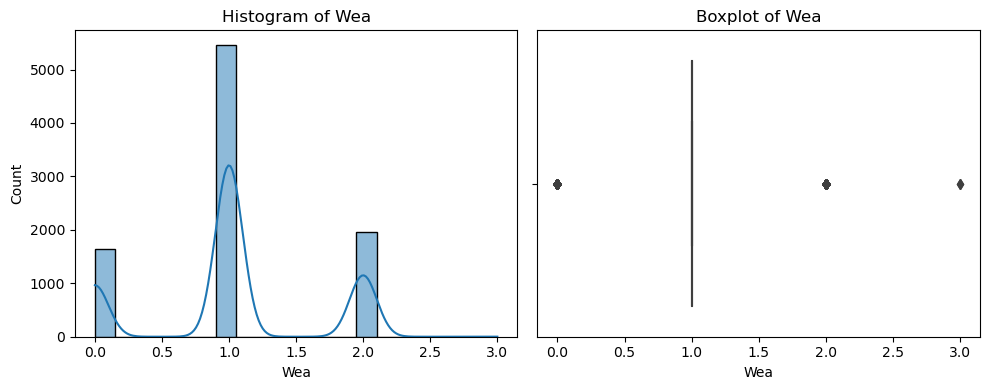

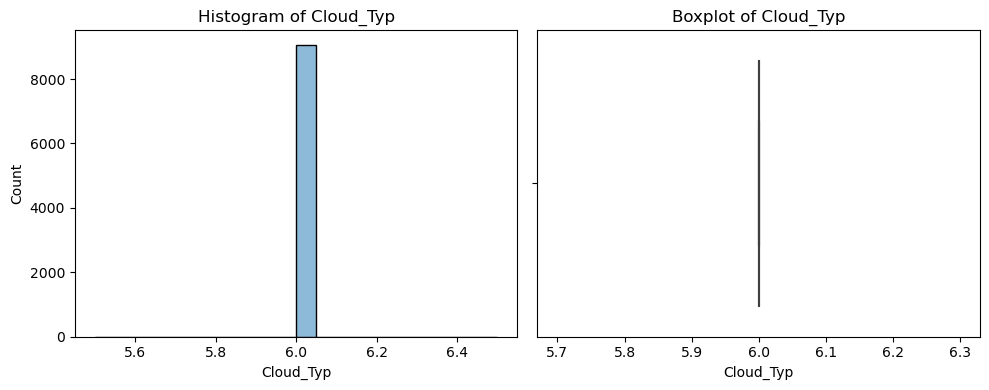

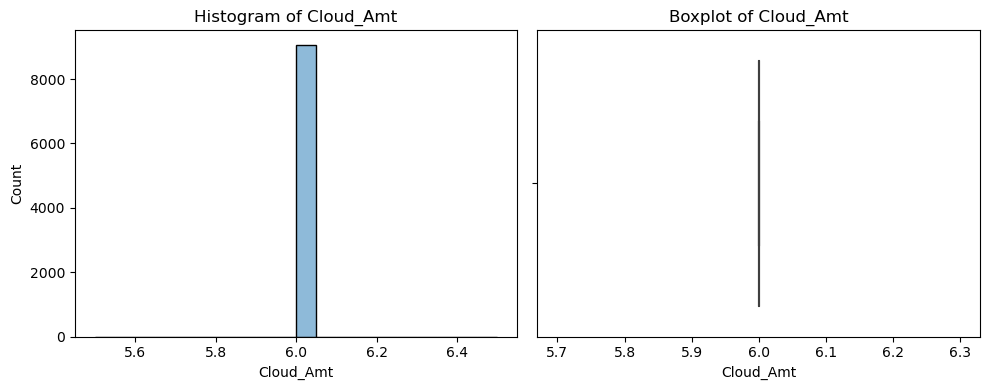

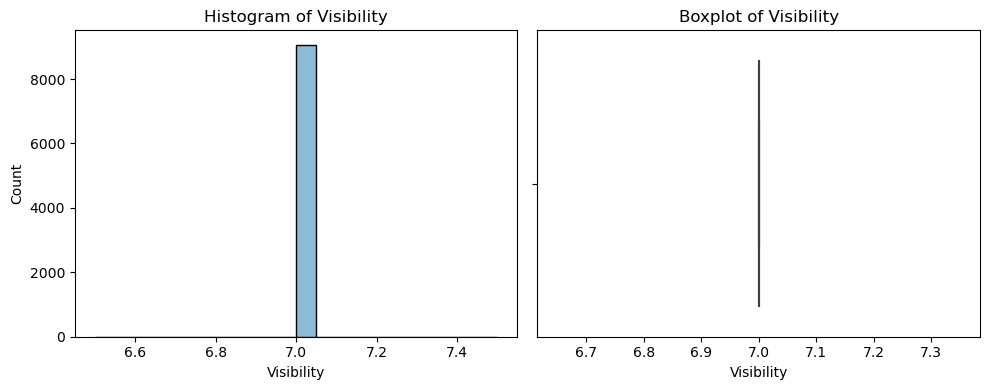

In [21]:
# Filter only numerical columns for correlation and plotting
numerical_cols_bottle = bottle_data.select_dtypes(include=['float64', 'int64']).columns
numerical_cols_cast = cast_data.select_dtypes(include=['float64', 'int64']).columns

# Check for remaining numerical columns
print("\nNumerical columns in Bottle dataset:", numerical_cols_bottle)
print("Numerical columns in Cast dataset:", numerical_cols_cast)

# Correlation matrix for numerical columns (after filtering for numeric columns)
correlation_matrix_bottle = bottle_data[numerical_cols_bottle].corr()
correlation_matrix_cast = cast_data[numerical_cols_cast].corr()

# Plot the correlation matrices
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix_bottle, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix for Bottle Dataset")
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix_cast, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix for Cast Dataset")
plt.show()

# Distribution plots for numerical columns in both datasets (histograms and boxplots)
plot_distribution(bottle_data, numerical_cols_bottle)
plot_distribution(cast_data, numerical_cols_cast)


In [22]:
# Check for missing values (should be 0)
print("\nMissing values in Bottle dataset:")
print(bottle_data.isnull().sum())

print("\nMissing values in Cast dataset:")
print(cast_data.isnull().sum())


Missing values in Bottle dataset:
Cst_Cnt          0
Btl_Cnt          0
Sta_ID           0
Depth_ID         0
Depthm           0
T_degC           0
Salnty           0
O2ml_L           0
STheta           0
O2Sat            0
Oxy_µmol/Kg      0
BtlNum           0
RecInd           0
T_prec           0
S_prec           0
P_qual           0
O_qual           0
O2Satq           0
ChlorA           0
Chlqua           0
Phaeop           0
Phaqua           0
PO4uM            0
PO4q             0
SiO3uM           0
SiO3qu           0
NO2uM            0
NO2q             0
NO3uM            0
NO3q             0
NH3uM            0
NH3q             0
C14A1q           0
C14A2q           0
DarkAq           0
MeanAq           0
R_Depth          0
R_TEMP           0
R_Sal            0
R_DYNHT          0
R_Nuts           0
R_Oxy_µmol/Kg    0
dtype: int64

Missing values in Cast dataset:
Cst_Cnt        0
Cruise_ID      0
Cruise         0
Cruz_Sta       0
DbSta_ID       0
Cast_ID        0
Sta_ID         0
Qu

### Step 5: Feature Engineering and Standard Scaling 
1. **Feature Engineering**
Feature engineering is the process of creating new features from existing ones to improve the predictive power of machine learning models. For this dataset, we can create the following features:

**Temperature Category**: Based on **T_degC**, we can categorize temperature into Low, Medium, and High.
Season from Date: Extract the month from Date to create a Season feature, which can be used to identify seasonal trends.

**Depth Category**: We can bin the Depthm values into categories like **"Shallow", "Medium", and "Deep".**

**2.Standard Scaling**
Standard scaling (or Z-score normalization) transforms the data to have a mean of 0 and a standard deviation of 1. This is important for machine learning models that rely on distance metrics or assume normality (e.g., logistic regression, KNN, SVM)

In [23]:
# 1. Create 'Temperature_Category' feature based on 'T_degC' (already done for bottle data)

# 2. Extract 'Month' and 'Season' from 'Date' in 'cast_data'
cast_data['Date'] = pd.to_datetime(cast_data['Date'], errors='coerce')  # Ensure 'Date' is in datetime format
cast_data['Month'] = cast_data['Date'].dt.month

# Create 'Season' feature based on the month
cast_data['Season'] = cast_data['Month'].map({
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
})

# 3. Create Depth Category based on 'Bottom_D' (Depth)
def categorize_depth(depth):
    if depth <= 50:
        return 'Shallow'
    elif 50 < depth <= 200:
        return 'Medium'
    else:
        return 'Deep'

# Apply Depth categorization to both bottle and cast data
bottle_data['Depth_Category'] = bottle_data['Depthm'].apply(categorize_depth)  # For bottle dataset
cast_data['Depth_Category'] = cast_data['Bottom_D'].apply(categorize_depth)  # For cast dataset

# 4. Encode categorical columns using Label Encoding (e.g., 'Quarter', 'Ship_Name')
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

# Encode 'Quarter' and 'Ship_Name'
cast_data['Quarter_Encoded'] = label_encoder.fit_transform(cast_data['Quarter'].fillna('Unknown'))
cast_data['Ship_Name_Encoded'] = label_encoder.fit_transform(cast_data['Ship_Name'].fillna('Unknown'))

# Check the resulting data
print(cast_data[['Date', 'Month', 'Season', 'Depth_Category', 'Quarter_Encoded', 'Ship_Name_Encoded']].head())


         Date  Month  Season Depth_Category  Quarter_Encoded  \
0  1949-03-01      3  Spring           Deep                0   
11 1949-03-05      3  Spring           Deep                0   
12 1949-03-05      3  Spring           Deep                0   
13 1949-03-05      3  Spring           Deep                0   
14 1949-03-06      3  Spring           Deep                0   

    Ship_Name_Encoded  
0                   1  
11                  1  
12                  1  
13                  1  
14                  1  


In [24]:
# Ensure both datasets have the same columns for scaling
common_numerical_cols = list(set(bottle_data.select_dtypes(include=['float64', 'int64']).columns) & 
                             set(cast_data.select_dtypes(include=['float64', 'int64']).columns))

# Apply standard scaling to the numerical columns in both bottle_data and cast_data
scaler = StandardScaler()

# Scaling bottle_data
bottle_data[common_numerical_cols] = scaler.fit_transform(bottle_data[common_numerical_cols])

# Scaling cast_data
cast_data[common_numerical_cols] = scaler.fit_transform(cast_data[common_numerical_cols])

# Check the first few rows of the scaled data
print("Scaled Bottle Data:\n", bottle_data[common_numerical_cols].head())
print("Scaled Cast Data:\n", cast_data[common_numerical_cols].head())


Scaled Bottle Data:
     Cst_Cnt
1 -1.934316
2 -1.934316
3 -1.934316
4 -1.934316
5 -1.934316
Scaled Cast Data:
      Cst_Cnt
0  -1.544069
11 -1.541961
12 -1.541770
13 -1.541578
14 -1.541386


**Standard Scaling**: Standard scaling transforms the data such that the mean of the feature becomes 0, and the standard deviation becomes 1. This is particularly useful for algorithms that rely on the distance between data points, such as K-means clustering, PCA, and others.

**Effect on Data**: After scaling, the values in the numerical columns will range around 0, which makes them comparable across different features. This helps in handling features with different scales (e.g., temperature in °C, oxygen concentration in µmol/Kg).

### Step 6: Univariate Analysis
Univariate analysis involves analyzing each feature independently to understand its distribution and central tendencies. In this step, we’ll visualize the distributions of numerical features using histograms and boxplots.

a. **Histograms for Numerical Features**
Histograms help visualize the distribution of each numerical feature and provide insight into its central tendency, spread, and skewness.

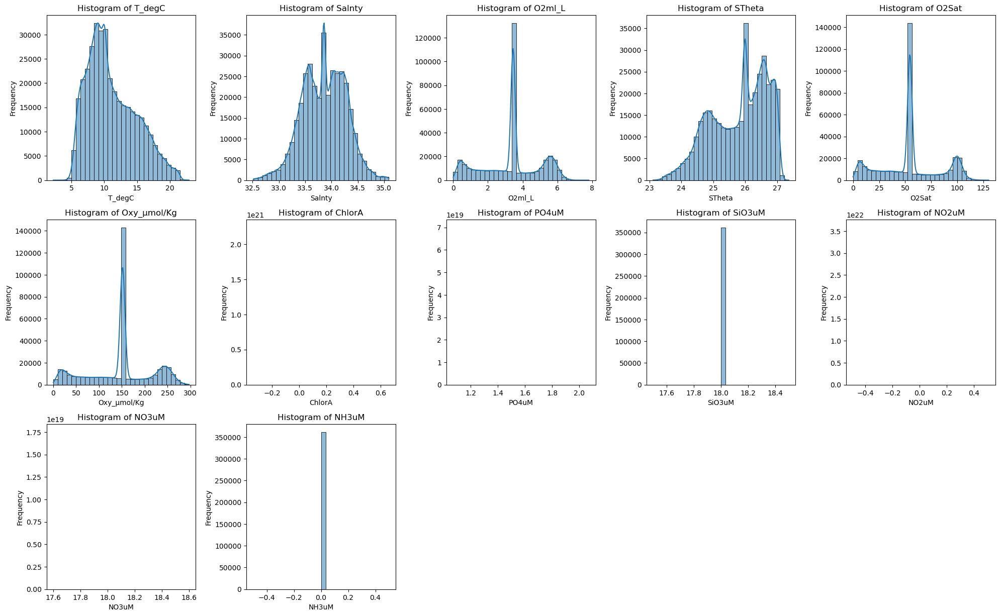

In [25]:
# Define numerical columns again (make sure they exist in the dataset)
numerical_cols = ['T_degC', 'Salnty', 'O2ml_L', 'STheta', 'O2Sat', 'Oxy_µmol/Kg', 
                  'ChlorA', 'PO4uM', 'SiO3uM', 'NO2uM', 'NO3uM', 'NH3uM']

# Filter numerical columns with non-empty values
valid_numerical_cols = [col for col in numerical_cols if bottle_data[col].notna().sum() > 0]

# Plot histograms for valid numerical columns
plt.figure(figsize=(20, 16))
for i, col in enumerate(valid_numerical_cols, 1):
    plt.subplot(4, 5, i)  # Adjust the layout for 5 columns per row
    sns.histplot(bottle_data[col], kde=True, bins=30)
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

b. **Boxplots for Outlier Detection**

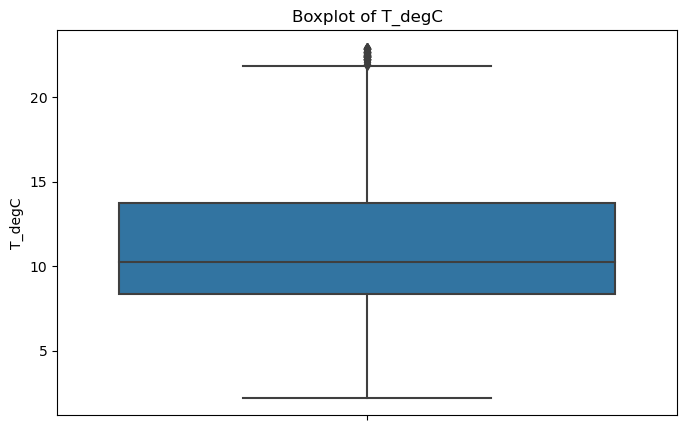

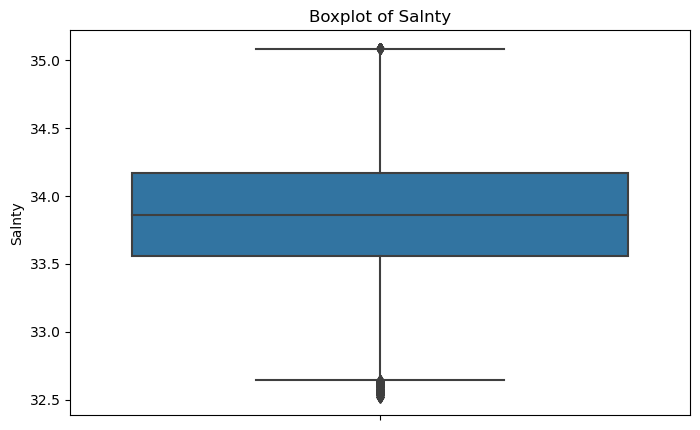

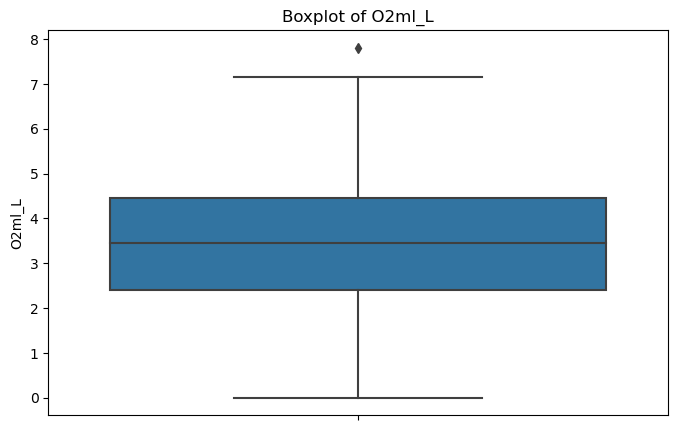

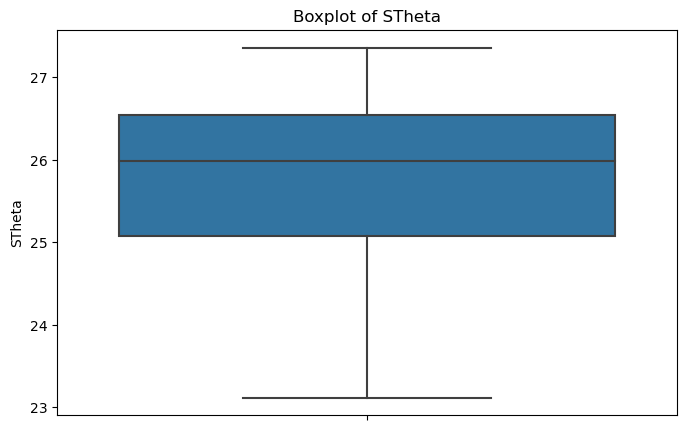

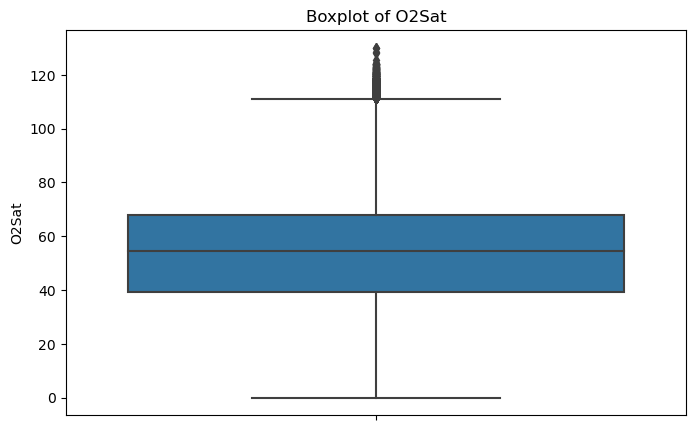

...

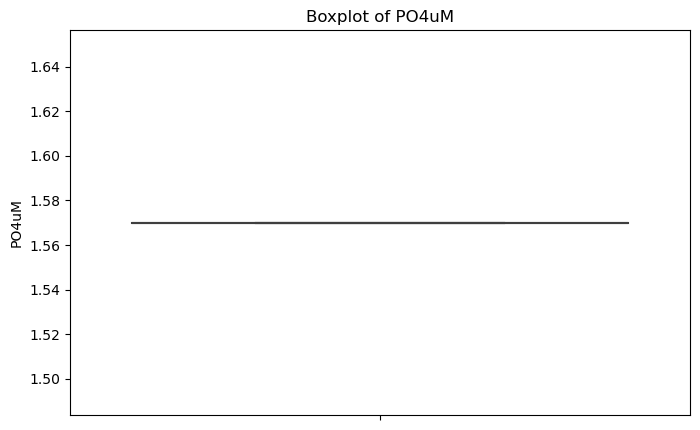

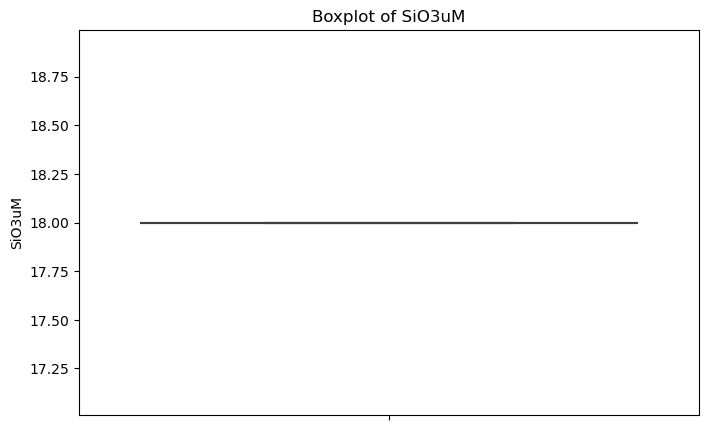

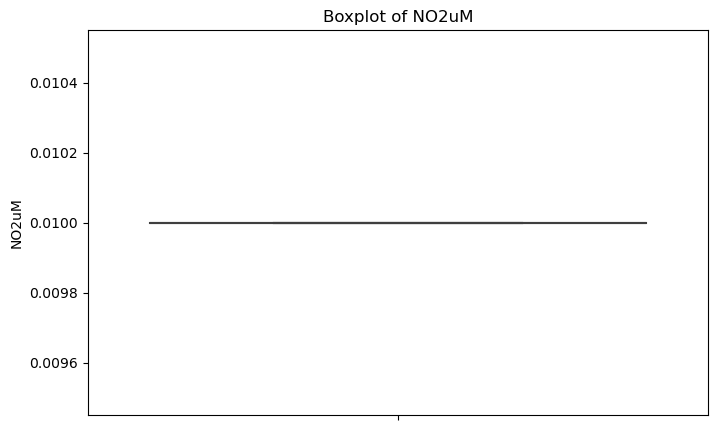

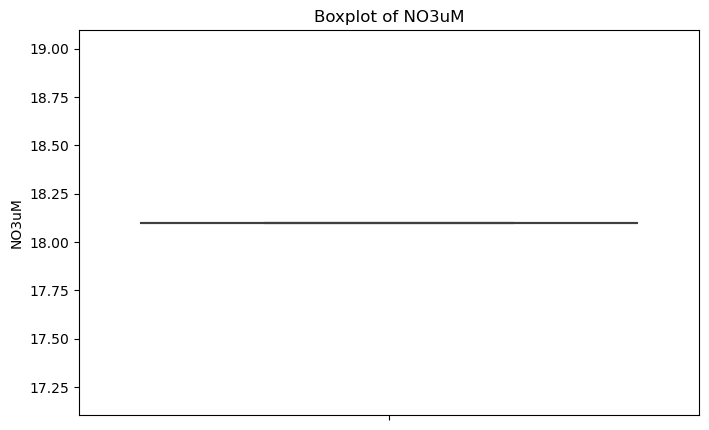

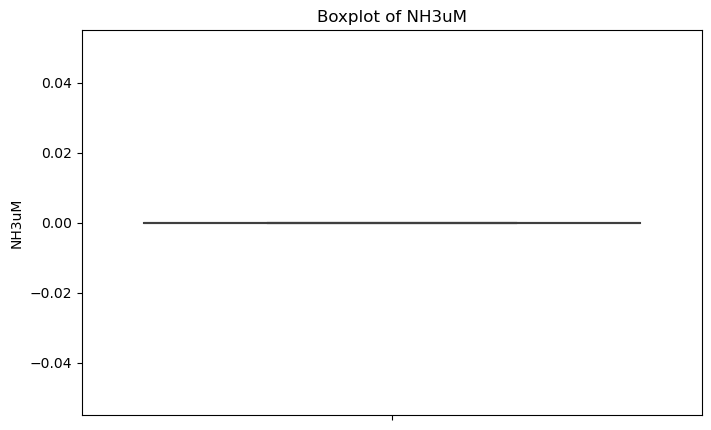

In [26]:
# Boxplots for valid numerical columns
for col in valid_numerical_cols:
    plt.figure(figsize=(8, 5))
    sns.boxplot(data=bottle_data, y=col)
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)
    plt.show()

### Step 7: Bivariate Analysis
Bivariate analysis examines relationships between two variables to identify patterns or dependencies. Here, we focus on numerical relationships and category-wise groupings.

**Scatter Plots**:

Plots relationships between T_degC (temperature) and other numerical features.
Helps identify trends or anomalies in the data.

**Correlation Heatmap**:

Measures the linear relationship between numerical features.
Aids in identifying highly correlated variables.
Boxplots:

Compares numerical data distributions across temperature categories (e.g., **Low**, **Moderate**, **High**).
Highlights variations based on groups.

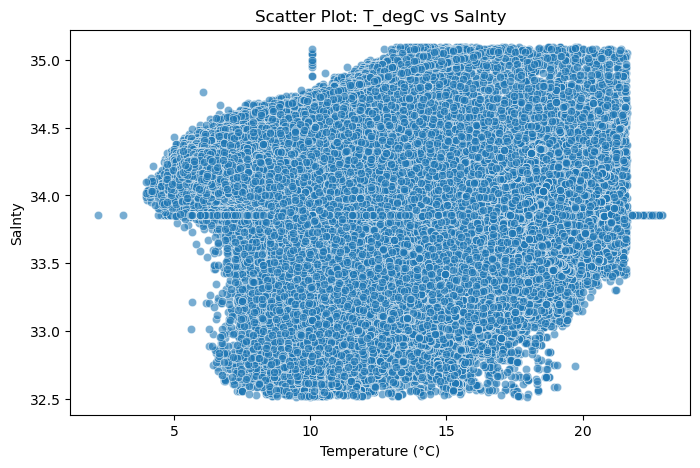

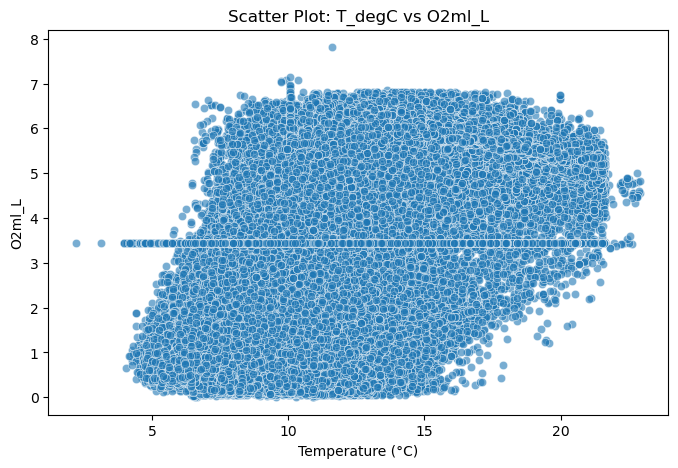

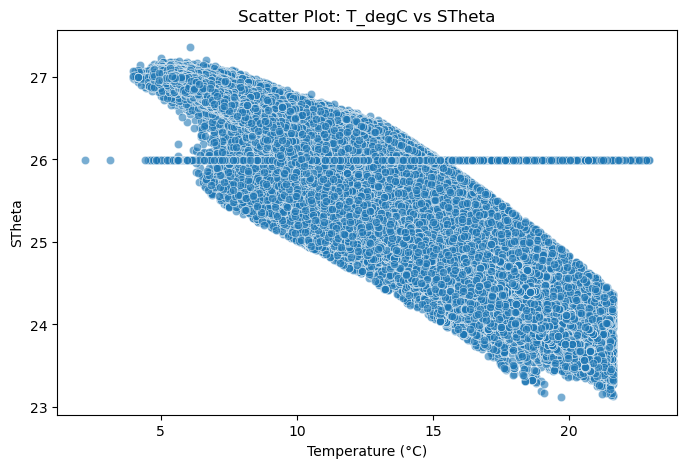

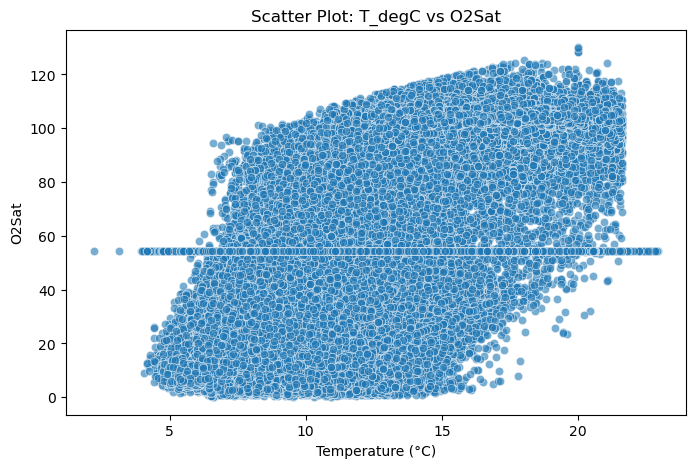

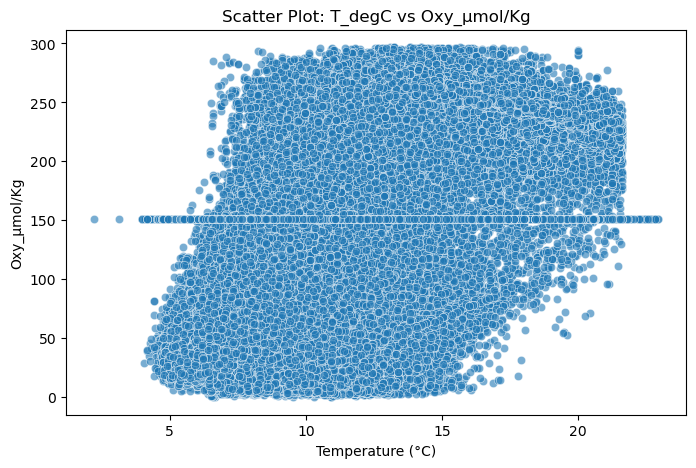

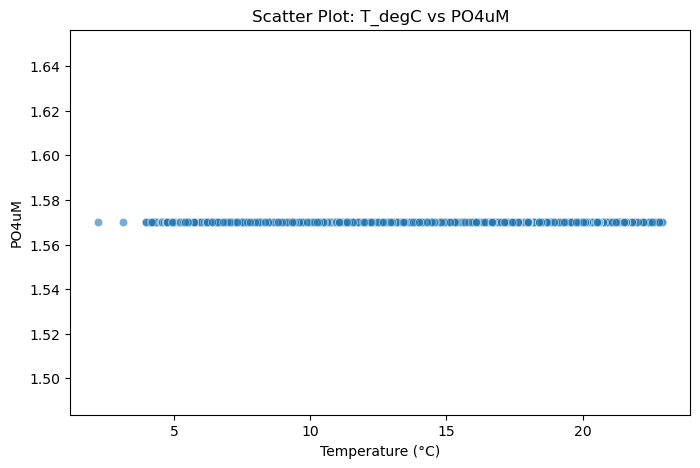

In [27]:
# Importing required libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plots for numerical relationships
numerical_cols = ['T_degC', 'Salnty', 'O2ml_L', 'STheta', 'O2Sat', 'Oxy_µmol/Kg', 
                  'PO4uM']

# Plotting scatter plots between 'T_degC' and other features in bottle_data
for col in numerical_cols:
    if col != 'T_degC' and col in bottle_data.columns:  # Skip if the column is empty or 'T_degC' itself
        plt.figure(figsize=(8, 5))
        sns.scatterplot(data=bottle_data, x='T_degC', y=col, alpha=0.6)
        plt.title(f'Scatter Plot: T_degC vs {col}')
        plt.xlabel('Temperature (°C)')
        plt.ylabel(col)
        plt.show()

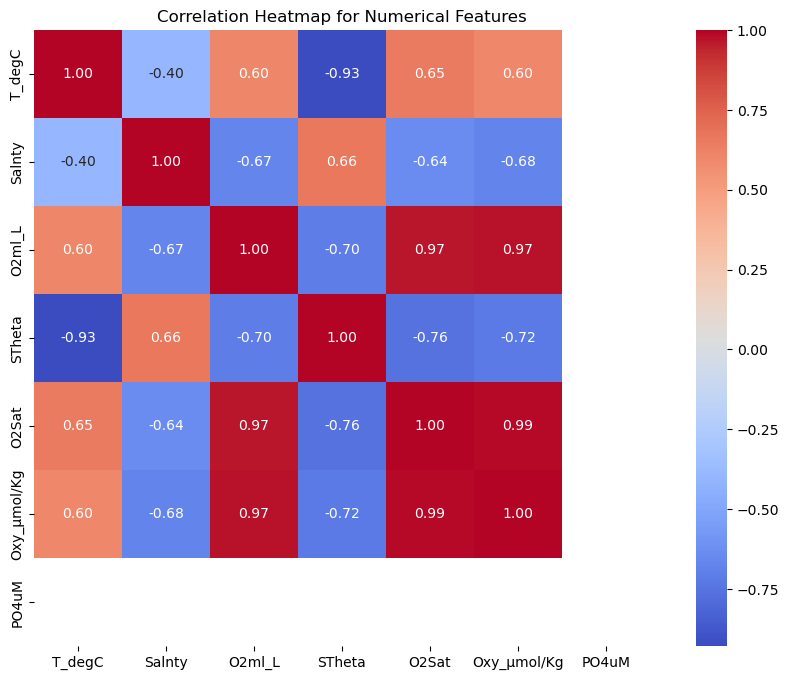

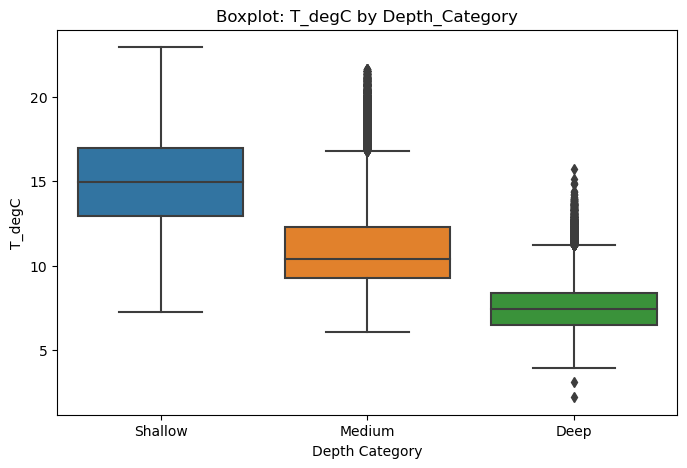

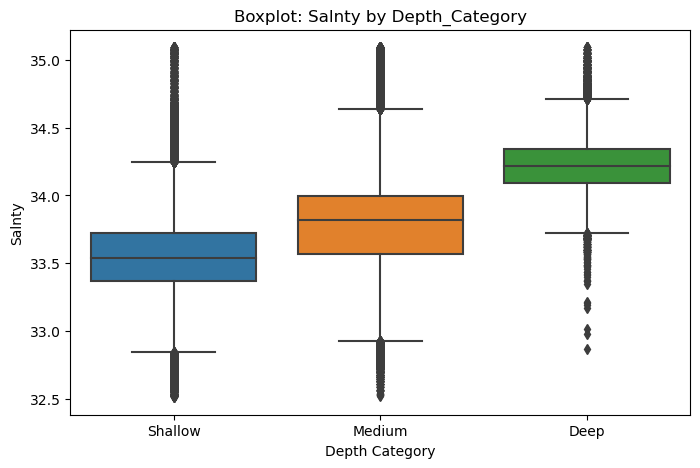

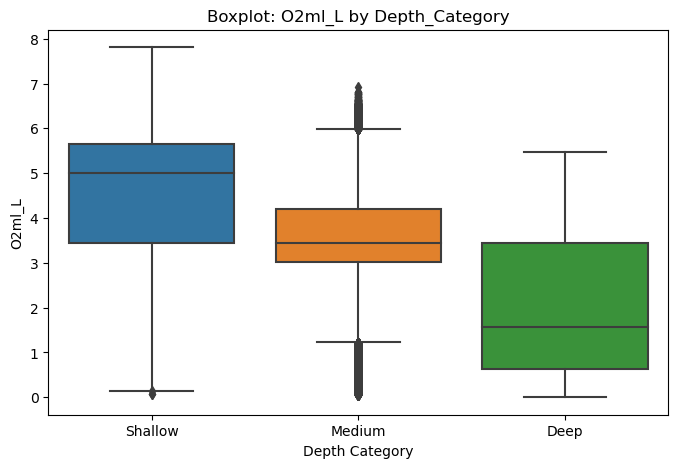

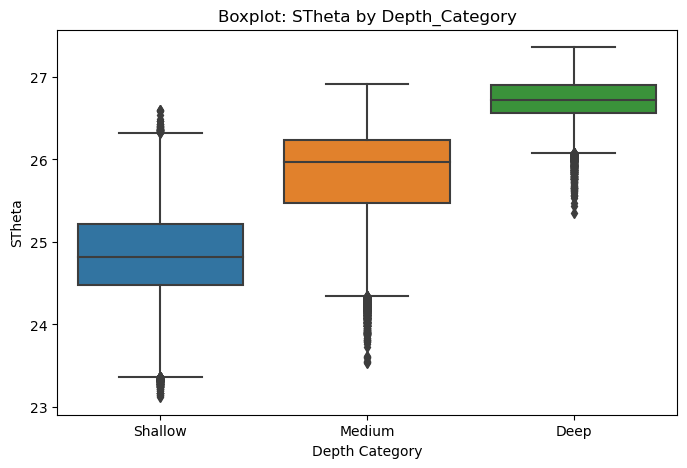

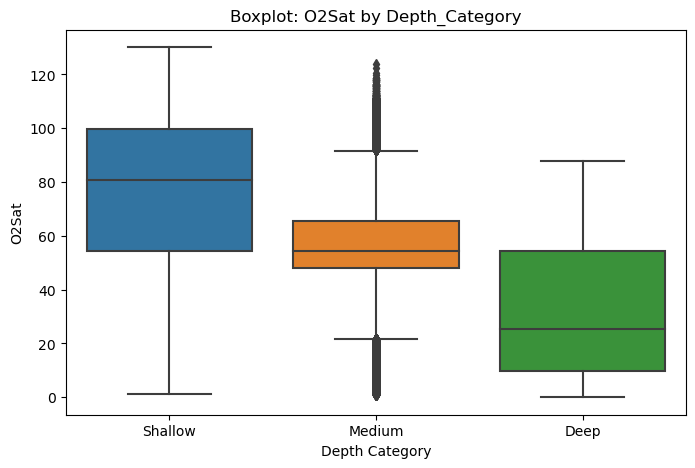

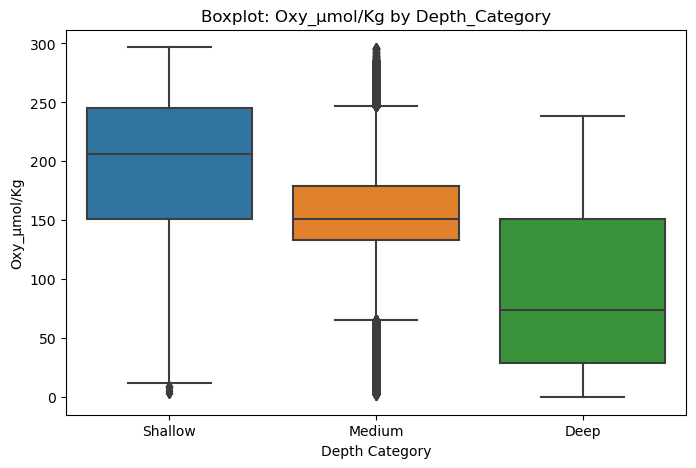

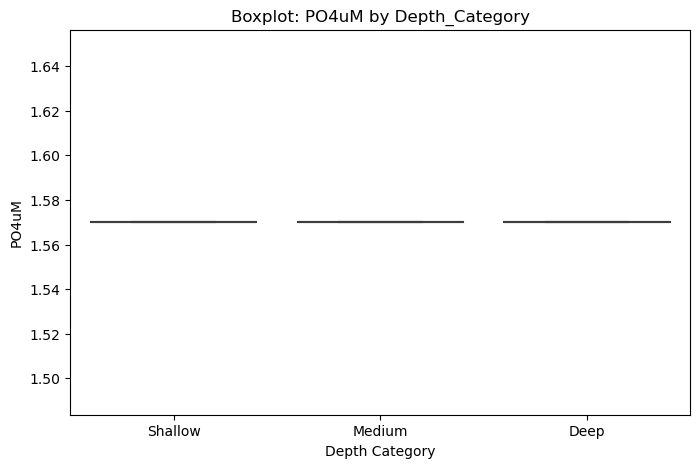

In [28]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
correlation_matrix = bottle_data[numerical_cols].corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Heatmap for Numerical Features')
plt.show()

# Boxplots for numerical features grouped by 'Temperature_Category'
for col in numerical_cols:
    if col in bottle_data.columns:  # Avoid plotting for missing or dropped features
        plt.figure(figsize=(8, 5))
        sns.boxplot(data=bottle_data, x='Depth_Category', y=col)
        plt.title(f'Boxplot: {col} by Depth_Category')
        plt.xlabel('Depth Category')
        plt.ylabel(col)
        plt.show()

### Step 8: Multivariate Analysis

**1. Correlation Heatmap**
A correlation heatmap is used to identify the strength of relationships between numeric features. Values closer to +1 indicate a strong positive correlation, values closer to -1 indicate a strong negative correlation, and values near 0 suggest no linear correlation.

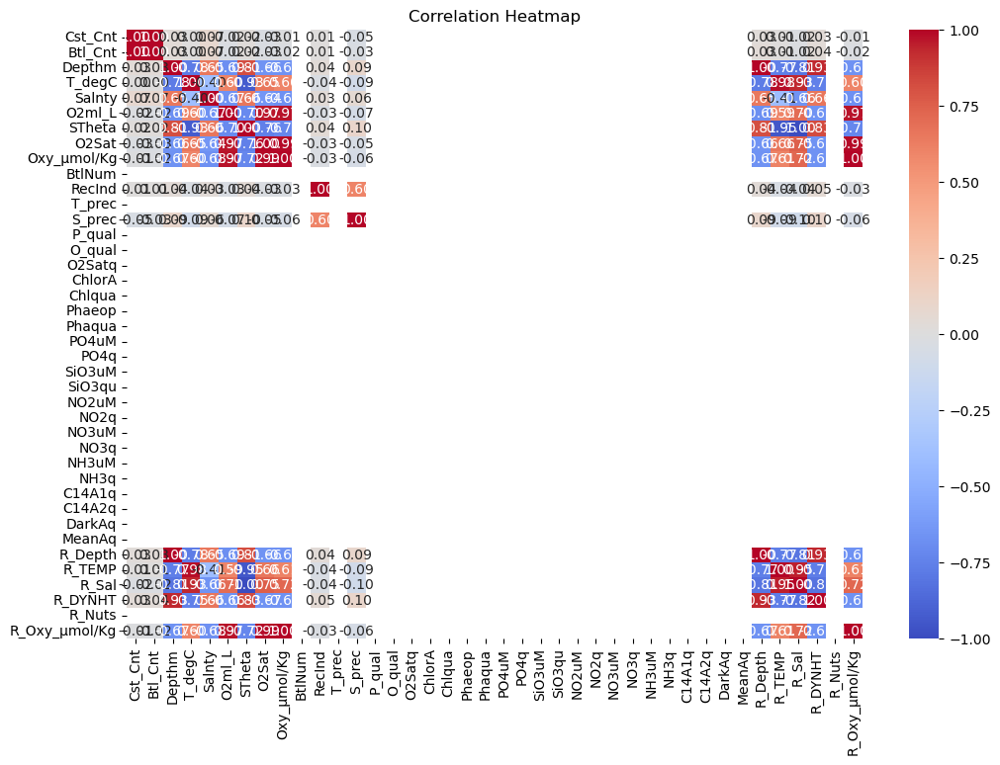

In [29]:
# Calculate the correlation matrix
corr_matrix = bottle_data.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()


**2. Pairplot**
A pairplot visualizes pairwise relationships between selected features. It’s helpful for identifying patterns or correlations among different combinations of features.

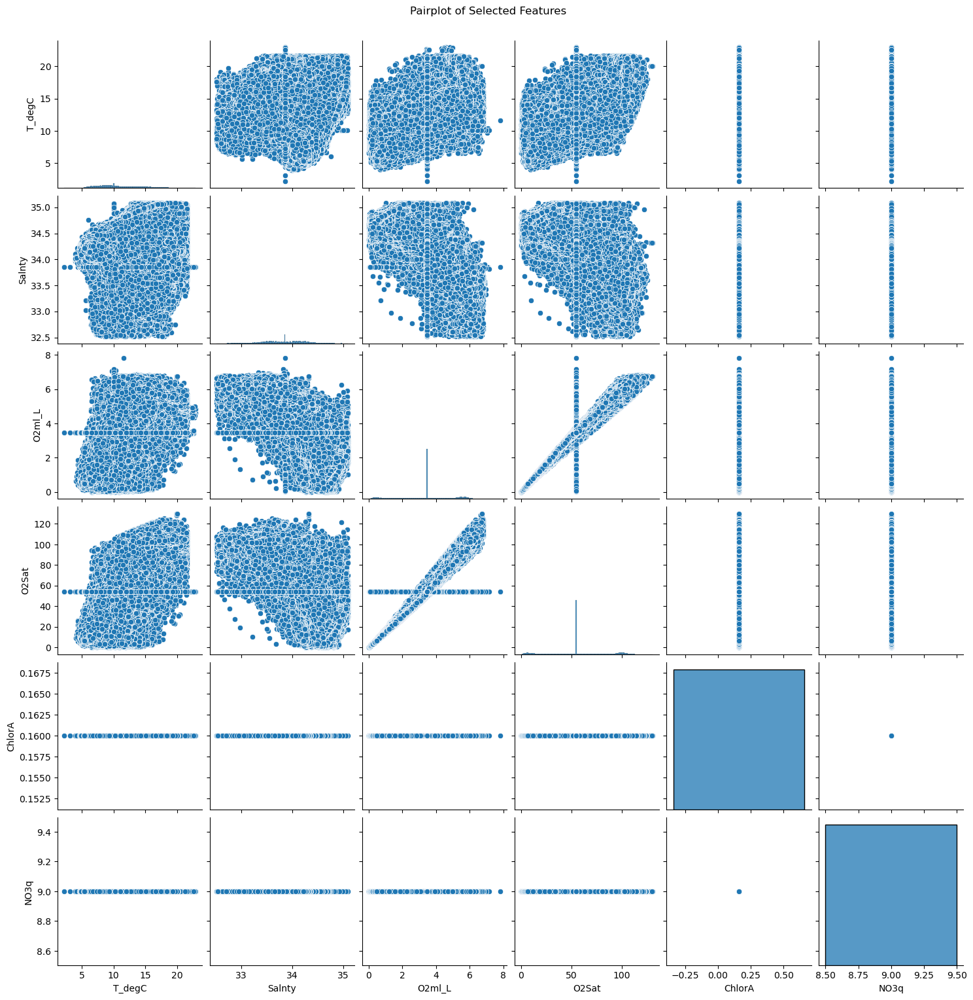

In [30]:
# Select a subset of numerical features for pairplot
pairplot_cols = ['T_degC', 'Salnty', 'O2ml_L', 'O2Sat', 'ChlorA', 'NO3q'] 
sns.pairplot(bottle_data[pairplot_cols])
plt.suptitle('Pairplot of Selected Features', y=1.02)
plt.show()


**3. Principal Component Analysis (PCA)**
PCA reduces the dimensionality of the data while retaining the maximum variance. This is helpful when we want to visualize high-dimensional data in 2D or 3D.

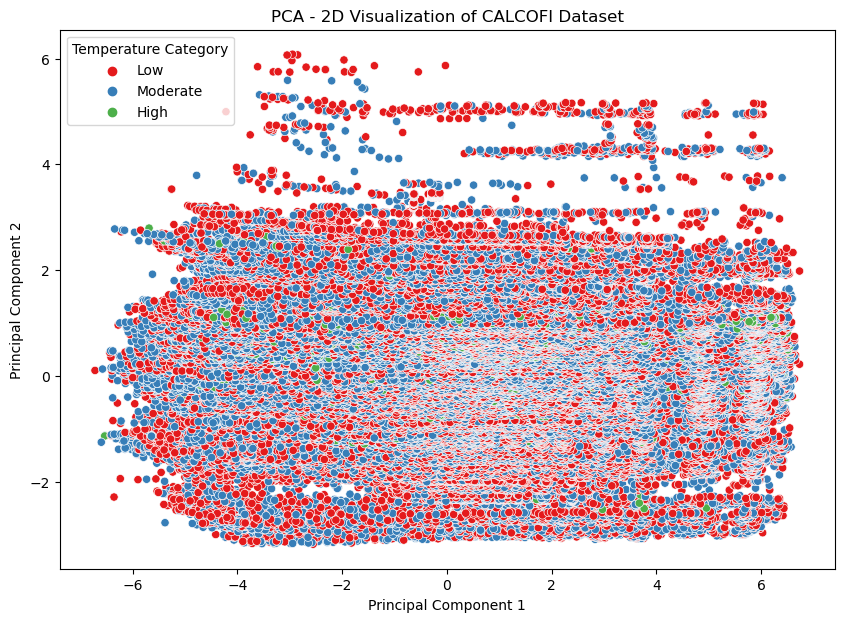

In [31]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Select numerical features from the dataset
numerical_features = bottle_data.select_dtypes(include=['float64', 'int64']).dropna()

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(numerical_features)

# Perform PCA
pca = PCA(n_components=2)  # Reduce to 2 principal components
principal_components = pca.fit_transform(scaled_features)

# Create a DataFrame for the PCA results
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Add the temperature category for coloring in the plot
if 'Temperature_Category' not in bottle_data.columns:
    bottle_data['Temperature_Category'] = pd.cut(
        bottle_data['T_degC'],
        bins=[-float('inf'), 10, 20, float('inf')],
        labels=['Low', 'Moderate', 'High']
    )

# Plot PCA results
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, hue=bottle_data['Temperature_Category'], palette='Set1')
plt.title('PCA - 2D Visualization of CALCOFI Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Temperature Category')
plt.show()


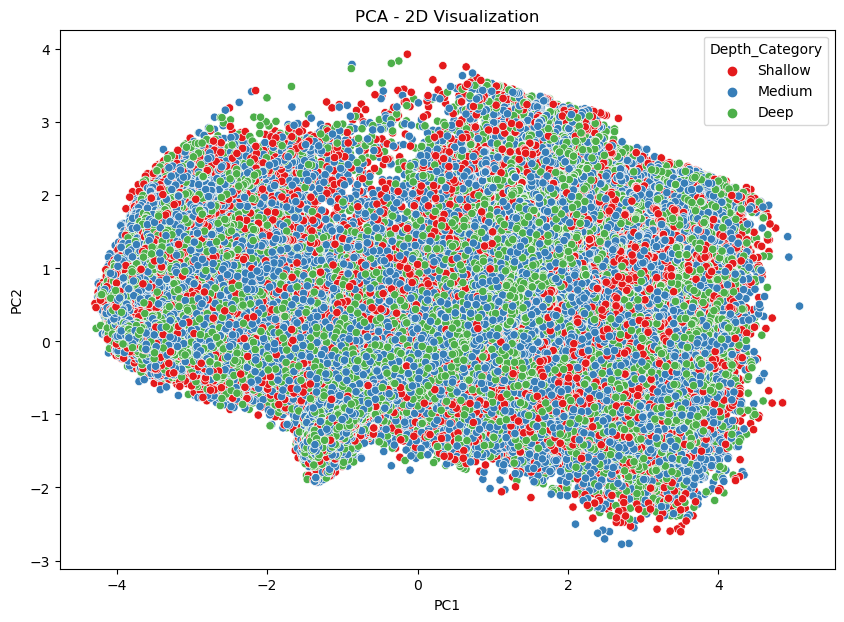

In [32]:
# Standardize the numerical features before applying PCA
numerical_data = bottle_data[numerical_cols].dropna()
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numerical_data)

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Create a DataFrame with the PCA result
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Plot the PCA result
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, hue=bottle_data['Depth_Category'], palette='Set1')
plt.title('PCA - 2D Visualization')
plt.show()


### Step 9 Depth-Based Analysis
In this section, we explore how variables change with depth. We will analyze the relationship between depth and key variables like T_degC, Salnty, and O2ml_L.

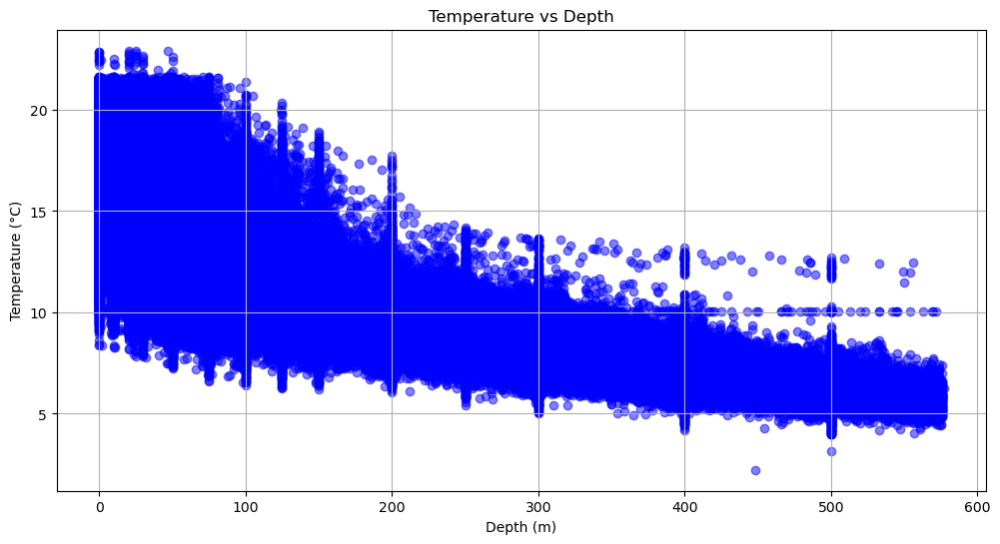

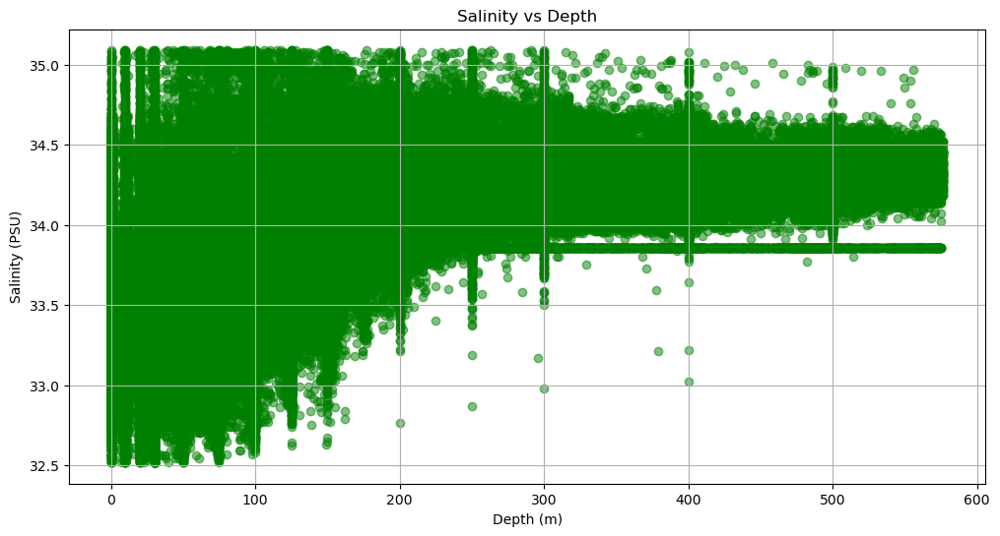

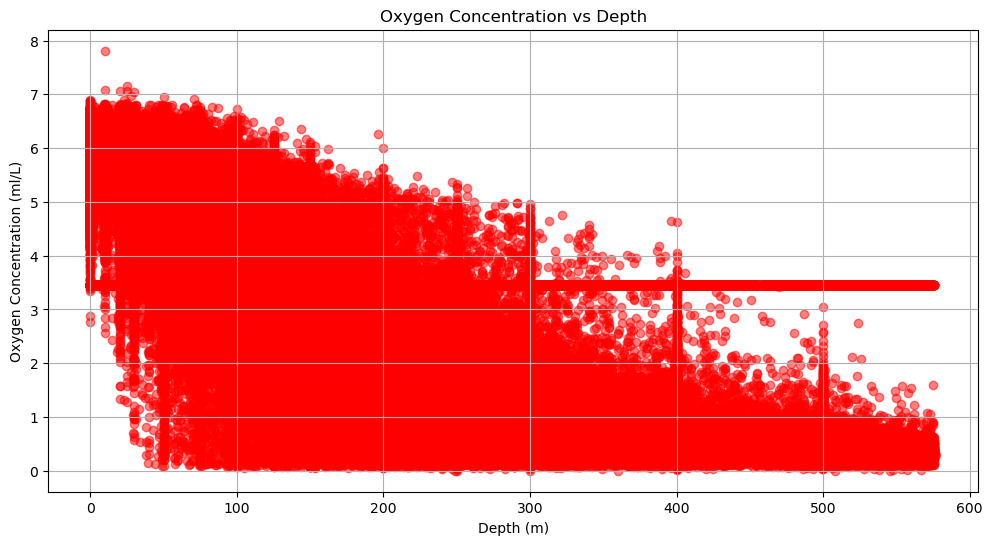

In [34]:
# Plotting Temperature vs Depth
plt.figure(figsize=(12, 6))
plt.scatter(bottle_data['Depthm'], bottle_data['T_degC'], c='blue', alpha=0.5)
plt.title('Temperature vs Depth')
plt.xlabel('Depth (m)')
plt.ylabel('Temperature (°C)')
plt.grid(True)
plt.show()

# Plotting Salinity vs Depth
plt.figure(figsize=(12, 6))
plt.scatter(bottle_data['Depthm'], bottle_data['Salnty'], c='green', alpha=0.5)
plt.title('Salinity vs Depth')
plt.xlabel('Depth (m)')
plt.ylabel('Salinity (PSU)')
plt.grid(True)
plt.show()

# Plotting Oxygen concentration vs Depth
plt.figure(figsize=(12, 6))
plt.scatter(bottle_data['Depthm'], bottle_data['O2ml_L'], c='red', alpha=0.5)
plt.title('Oxygen Concentration vs Depth')
plt.xlabel('Depth (m)')
plt.ylabel('Oxygen Concentration (ml/L)')
plt.grid(True)
plt.show()


### Step 10 Spatial Analysis
To analyze the geographical patterns of temperature (T_degC) using latitude and longitude coordinates in the CALCOFI dataset.



In [36]:
# Check column names
print("Bottle Data Columns:", bottle_data.columns)
print("Cast Data Columns:", cast_data.columns)


Bottle Data Columns: Index(['Cst_Cnt', 'Btl_Cnt', 'Sta_ID', 'Depth_ID', 'Depthm', 'T_degC',
       'Salnty', 'O2ml_L', 'STheta', 'O2Sat', 'Oxy_µmol/Kg', 'BtlNum',
       'RecInd', 'T_prec', 'S_prec', 'P_qual', 'O_qual', 'O2Satq', 'ChlorA',
       'Chlqua', 'Phaeop', 'Phaqua', 'PO4uM', 'PO4q', 'SiO3uM', 'SiO3qu',
       'NO2uM', 'NO2q', 'NO3uM', 'NO3q', 'NH3uM', 'NH3q', 'C14A1q', 'C14A2q',
       'DarkAq', 'MeanAq', 'R_Depth', 'R_TEMP', 'R_Sal', 'R_DYNHT', 'R_Nuts',
       'R_Oxy_µmol/Kg', 'Depth_Category', 'Temperature_Category'],
      dtype='object')
Cast Data Columns: Index(['Cst_Cnt', 'Cruise_ID', 'Cruise', 'Cruz_Sta', 'DbSta_ID', 'Cast_ID',
       'Sta_ID', 'Quarter', 'Sta_Code', 'Distance', 'Date', 'Year', 'Month',
       'Julian_Date', 'Julian_Day', 'Time', 'Lat_Dec', 'Lat_Deg', 'Lat_Min',
       'Lat_Hem', 'Lon_Dec', 'Lon_Deg', 'Lon_Min', 'Lon_Hem', 'Rpt_Line',
       'St_Line', 'Ac_Line', 'Rpt_Sta', 'St_Station', 'Ac_Sta', 'Bottom_D',
       'Secchi', 'Ship_Name', 'Ship_Code',

In [37]:
# Standardize column names
bottle_data.columns = bottle_data.columns.str.strip()
cast_data.columns = cast_data.columns.str.strip()

# Rename columns if required
bottle_data.rename(columns={'Lat': 'Lat_Dec', 'Lon': 'Lon_Dec'}, inplace=True)


In [38]:
# Merge datasets: Add Lat_Dec and Lon_Dec from cast_data to bottle_data
merged_data = bottle_data.merge(
    cast_data[['Sta_ID', 'Lat_Dec', 'Lon_Dec']],
    on='Sta_ID', 
    how='left'
)

# Verify the merged data
print(merged_data.head())

    Cst_Cnt  Btl_Cnt       Sta_ID                                Depth_ID  \
0 -1.934316      2.0  054.0 056.0  19-4903CR-HY-060-0930-05400560-0008A-3   
1 -1.934316      2.0  054.0 056.0  19-4903CR-HY-060-0930-05400560-0008A-3   
2 -1.934316      2.0  054.0 056.0  19-4903CR-HY-060-0930-05400560-0008A-3   
3 -1.934316      2.0  054.0 056.0  19-4903CR-HY-060-0930-05400560-0008A-3   
4 -1.934316      2.0  054.0 056.0  19-4903CR-HY-060-0930-05400560-0008A-3   

   Depthm  T_degC  Salnty  O2ml_L  STheta  O2Sat  ...  R_Depth  R_TEMP  R_Sal  \
0     8.0   10.46   33.44    3.45  25.656   54.5  ...      8.0   10.46  232.5   
1     8.0   10.46   33.44    3.45  25.656   54.5  ...      8.0   10.46  232.5   
2     8.0   10.46   33.44    3.45  25.656   54.5  ...      8.0   10.46  232.5   
3     8.0   10.46   33.44    3.45  25.656   54.5  ...      8.0   10.46  232.5   
4     8.0   10.46   33.44    3.45  25.656   54.5  ...      8.0   10.46  232.5   

   R_DYNHT  R_Nuts  R_Oxy_µmol/Kg  Depth_Category 

In [39]:
from shapely.geometry import Point
import geopandas as gpd

# Create geometry column
geometry = [Point(xy) for xy in zip(merged_data['Lon_Dec'], merged_data['Lat_Dec'])]
gdf = gpd.GeoDataFrame(merged_data, geometry=geometry)


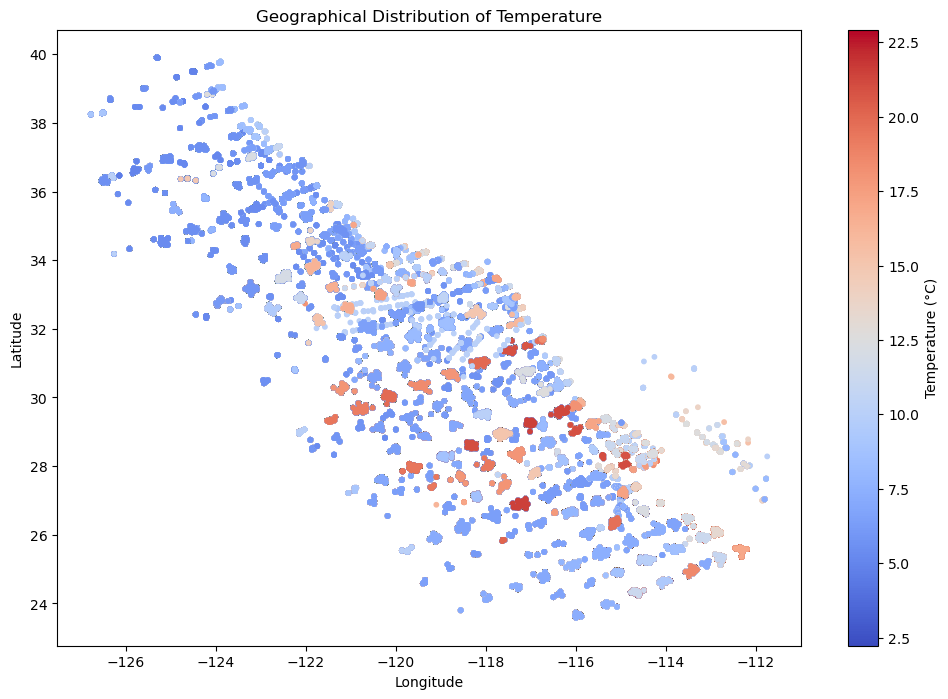

In [40]:
plt.figure(figsize=(12, 8))
sc = plt.scatter(gdf['Lon_Dec'], gdf['Lat_Dec'], c=gdf['T_degC'], cmap='coolwarm', s=10)
plt.colorbar(sc, label="Temperature (°C)")
plt.title("Geographical Distribution of Temperature")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## Step 11 Temporal Analysis

### Objective
- Analyze how key parameters (e.g., temperature, salinity, oxygen levels) vary over time (monthly, yearly, or seasonally).
- Highlight trends and anomalies.

### Features Used
- **Temporal Features**: `Date`, `Year`, `Month`, `Season` (from `cast_data`).
- **Key Parameters**: `T_degC` (temperature), `Salnty` (salinity), `O2ml_L` (oxygen levels) (from `bottle_data`).

### Steps
1. Merge `bottle_data` and `cast_data` to include temporal columns.
2. Aggregate data by year and month.
3. Visualize trends:
   - **Yearly Trends**: Line plots for key parameters.
   - **Monthly Trends**: Heatmap for temperature trends.

In [41]:
# Merge bottle_data and cast_data on 'Sta_ID' to include temporal columns
temporal_data = bottle_data.merge(cast_data[['Sta_ID', 'Date', 'Year', 'Month', 'Season']], on='Sta_ID', how='left')

# Aggregate by year and month
temporal_grouped = temporal_data.groupby(['Year', 'Month']).agg({
    'T_degC': 'mean',
    'Salnty': 'mean',
    'O2ml_L': 'mean'
}).reset_index()

# Display the aggregated data
temporal_grouped.head()

,Year,Month,T_degC,Salnty,O2ml_L
0,1949.0,3.0,11.330889,33.804470,3.505327
1,1949.0,4.0,11.204991,33.811796,3.460570
2,1949.0,5.0,11.174830,33.780289,3.542308
3,1949.0,6.0,11.615684,33.838526,3.486601
4,1949.0,7.0,11.099006,33.798064,3.506506


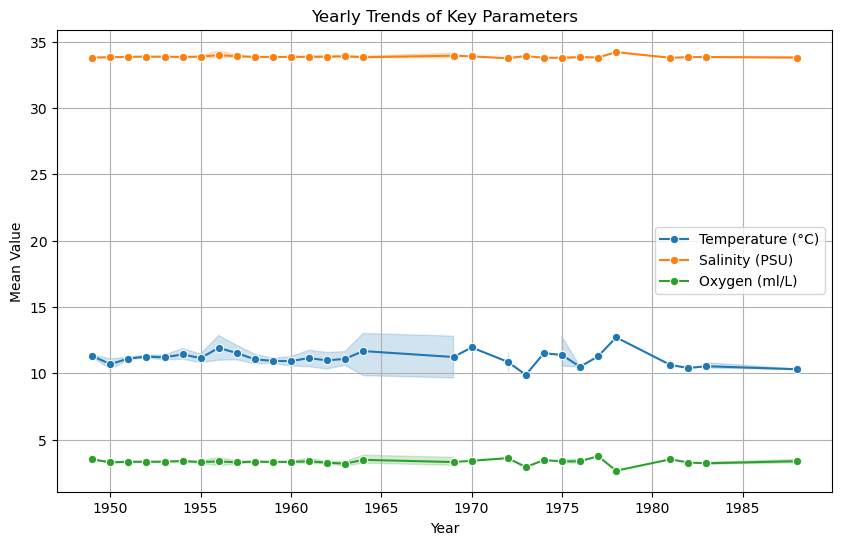

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Line plots for yearly trends
plt.figure(figsize=(10, 6))
sns.lineplot(data=temporal_grouped, x='Year', y='T_degC', label='Temperature (°C)', marker='o')
sns.lineplot(data=temporal_grouped, x='Year', y='Salnty', label='Salinity (PSU)', marker='o')
sns.lineplot(data=temporal_grouped, x='Year', y='O2ml_L', label='Oxygen (ml/L)', marker='o')
plt.title("Yearly Trends of Key Parameters")
plt.xlabel("Year")
plt.ylabel("Mean Value")
plt.legend()
plt.grid(True)
plt.show()

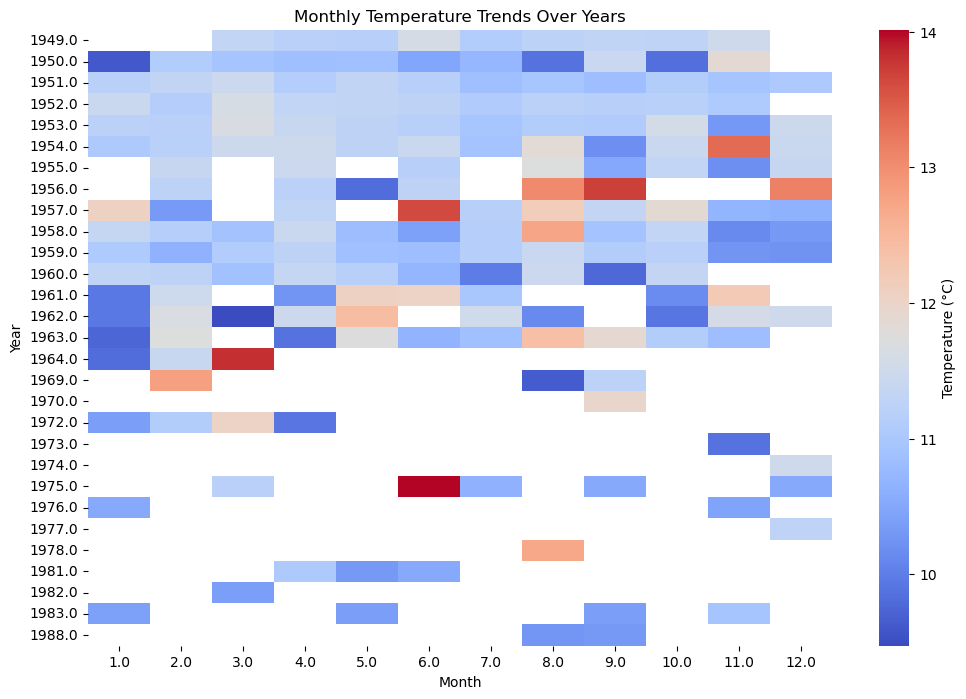

In [43]:
# Pivot data for heatmap
monthly_pivot = temporal_grouped.pivot_table(index='Year', columns='Month', values='T_degC')

# Heatmap for temperature trends
plt.figure(figsize=(12, 8))
sns.heatmap(monthly_pivot, cmap='coolwarm', annot=False, cbar_kws={'label': 'Temperature (°C)'})
plt.title("Monthly Temperature Trends Over Years")
plt.xlabel("Month")
plt.ylabel("Year")
plt.show()